In [ ]:
# Parameter Tuning for Sales Forecasting Model

This notebook implements parameter tuning for the Prophet model using grid search. It evaluates different hyperparameter combinations and selects the best model based on performance metrics.


/Users/alexanderschou/Library/Caches/pypoetry/virtualenvs/at2-experimentation-YINVk6u--py3.12/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
Importing plotly failed. Interactive plots will not work.
/var/folders/mh/j3zy8xqx2v32dk0tv4nx5x8m0000gn/T/ipykernel_6592/2525997077.py:13: DtypeWarning: Columns (9,10) have mixed types. Specify dtype option on import or set low_memory=False.
  sales_train_processed = pd.read_csv(train_path)
/var/folders/mh/j3zy8xqx2v32dk0tv4nx5x8m0000gn/T/ipykernel_6592/2525997077.py:14: DtypeWarning: Columns (11,12) have mixed types. Specify dtype option on import or set low_memory=False.
  sales_test_processed = pd.read_csv(test_path)


Tuning parameters: changepoint_prior_scale=0.001, seasonality_mode=additive


09:29:49 - cmdstanpy - INFO - Chain [1] start processing
09:29:49 - cmdstanpy - INFO - Chain [1] done processing
/Users/alexanderschou/Library/Caches/pypoetry/virtualenvs/at2-experimentation-YINVk6u--py3.12/lib/python3.12/site-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
09:29:50 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Error (MAE): 9058.712775491294
Root Mean Squared Error (RMSE): 12872.25878384094
Mean Absolute Percentage Error (MAPE): 941.86%
Tuning parameters: changepoint_prior_scale=0.001, seasonality_mode=multiplicative


09:29:50 - cmdstanpy - INFO - Chain [1] done processing
/Users/alexanderschou/Library/Caches/pypoetry/virtualenvs/at2-experimentation-YINVk6u--py3.12/lib/python3.12/site-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
09:29:50 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Error (MAE): 8603.371866176745
Root Mean Squared Error (RMSE): 12271.550830159062
Mean Absolute Percentage Error (MAPE): 930.40%
Tuning parameters: changepoint_prior_scale=0.01, seasonality_mode=additive


09:29:50 - cmdstanpy - INFO - Chain [1] done processing
/Users/alexanderschou/Library/Caches/pypoetry/virtualenvs/at2-experimentation-YINVk6u--py3.12/lib/python3.12/site-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Mean Absolute Error (MAE): 11271.99534117613
Root Mean Squared Error (RMSE): 15166.589594932888
Mean Absolute Percentage Error (MAPE): 891.57%
Tuning parameters: changepoint_prior_scale=0.01, seasonality_mode=multiplicative


09:29:51 - cmdstanpy - INFO - Chain [1] start processing
09:29:51 - cmdstanpy - INFO - Chain [1] done processing
/Users/alexanderschou/Library/Caches/pypoetry/virtualenvs/at2-experimentation-YINVk6u--py3.12/lib/python3.12/site-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Mean Absolute Error (MAE): 11101.438275131006
Root Mean Squared Error (RMSE): 14734.409695093696
Mean Absolute Percentage Error (MAPE): 878.23%
Tuning parameters: changepoint_prior_scale=0.1, seasonality_mode=additive


09:29:51 - cmdstanpy - INFO - Chain [1] start processing
09:29:51 - cmdstanpy - INFO - Chain [1] done processing
/Users/alexanderschou/Library/Caches/pypoetry/virtualenvs/at2-experimentation-YINVk6u--py3.12/lib/python3.12/site-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
09:29:52 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Error (MAE): 9831.970818422724
Root Mean Squared Error (RMSE): 13662.584230646418
Mean Absolute Percentage Error (MAPE): 915.70%
Tuning parameters: changepoint_prior_scale=0.1, seasonality_mode=multiplicative


09:29:52 - cmdstanpy - INFO - Chain [1] done processing
/Users/alexanderschou/Library/Caches/pypoetry/virtualenvs/at2-experimentation-YINVk6u--py3.12/lib/python3.12/site-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Mean Absolute Error (MAE): 9265.711606229546
Root Mean Squared Error (RMSE): 12906.707460002763
Mean Absolute Percentage Error (MAPE): 905.91%
Best Parameters: {'changepoint_prior_scale': 0.001, 'seasonality_mode': 'multiplicative'}


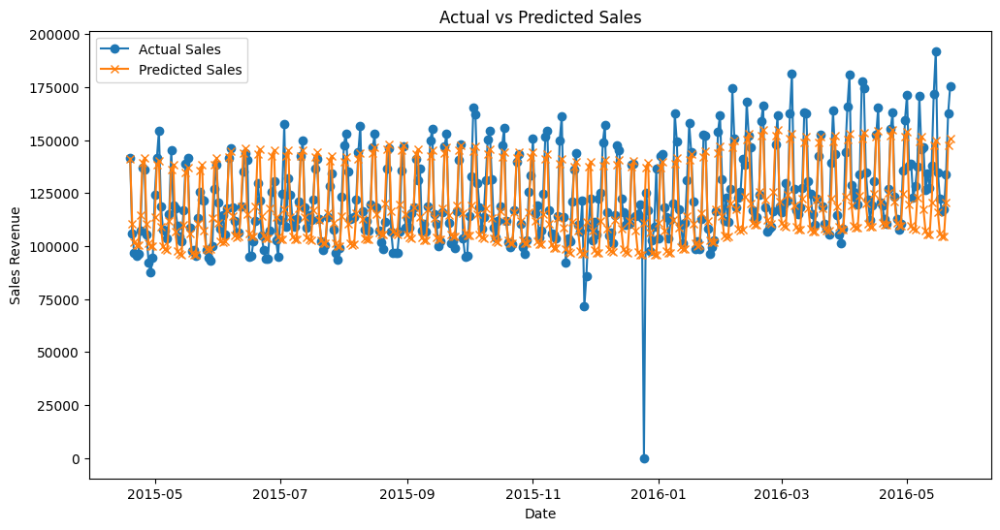

In [1]:
# Import necessary libraries
import pandas as pd
from prophet import Prophet
from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_absolute_percentage_error
import joblib
import os
import matplotlib.pyplot as plt
from itertools import product

# Function to load data
def load_data(train_path, test_path):
    try:
        sales_train_processed = pd.read_csv(train_path)
        sales_test_processed = pd.read_csv(test_path)
        return sales_train_processed, sales_test_processed
    except Exception as e:
        print(f"Error loading data: {e}")
        return None, None

# Function to preprocess data
def preprocess_data(sales_train, sales_test):
    sales_train['date'] = pd.to_datetime(sales_train['date'])
    sales_test['date'] = pd.to_datetime(sales_test['date'])

    daily_sales_train = sales_train.groupby('date')['revenue'].sum().reset_index()
    daily_sales_train.rename(columns={'date': 'ds', 'revenue': 'y'}, inplace=True)

    daily_sales_test = sales_test.groupby('date')['revenue'].sum().reset_index()
    daily_sales_test.rename(columns={'date': 'ds', 'revenue': 'y'}, inplace=True)

    return daily_sales_train, daily_sales_test

# Function to fit the Prophet model
def fit_prophet_model(train_data, **params):
    model = Prophet(**params)
    model.add_country_holidays(country_name='US')
    model.fit(train_data)
    return model

# Function to evaluate the model
def evaluate_model(test_data, forecast_data):
    mae = mean_absolute_error(test_data['y'], forecast_data['yhat'])
    rmse = mean_squared_error(test_data['y'], forecast_data['yhat'], squared=False)
    mape = mean_absolute_percentage_error(test_data['y'], forecast_data['yhat']) * 100

    return mae, rmse, mape

# Function to plot forecast
def plot_forecast(actual, forecast):
    plt.figure(figsize=(12, 6))
    plt.plot(actual['ds'], actual['y'], label='Actual Sales', marker='o')
    plt.plot(forecast['ds'], forecast['yhat'], label='Predicted Sales', marker='x')
    plt.title('Actual vs Predicted Sales')
    plt.xlabel('Date')
    plt.ylabel('Sales Revenue')
    plt.legend()
    plt.show()

# Main execution
# Set working directory and file paths
os.chdir("/Users/alexanderschou/Desktop/Projects/adv_mla_2024/AT2_experimentation/data/processed")
train_path = 'sales_train_processed.csv'
test_path = 'sales_test_processed.csv'

# Load and preprocess data
sales_train, sales_test = load_data(train_path, test_path)
if sales_train is None or sales_test is None:
    raise Exception("Failed to load data")

daily_sales_train, daily_sales_test = preprocess_data(sales_train, sales_test)

# Define hyperparameters for tuning
changepoint_prior_scales = [0.001, 0.01, 0.1]
seasonality_modes = ['additive', 'multiplicative']

best_mae = float('inf')
best_params = {}

# Perform parameter tuning
for changepoint_prior_scale, seasonality_mode in product(changepoint_prior_scales, seasonality_modes):
    print(f"Tuning parameters: changepoint_prior_scale={changepoint_prior_scale}, seasonality_mode={seasonality_mode}")

    model = fit_prophet_model(daily_sales_train, changepoint_prior_scale=changepoint_prior_scale, 
                               seasonality_mode=seasonality_mode)

    # Make predictions
    future_test = model.make_future_dataframe(periods=len(daily_sales_test), include_history=False)
    forecast_test = model.predict(future_test)

    # Evaluate the model
    forecast_test_filtered = forecast_test[['ds', 'yhat']].head(len(daily_sales_test))
    evaluation_df = pd.merge(daily_sales_test, forecast_test_filtered, on='ds')

    mae, rmse, mape = evaluate_model(evaluation_df, forecast_test_filtered)
    print(f"Mean Absolute Error (MAE): {mae}")
    print(f"Root Mean Squared Error (RMSE): {rmse}")
    print(f"Mean Absolute Percentage Error (MAPE): {mape:.2f}%")

    # Save best model based on MAE
    if mae < best_mae:
        best_mae = mae
        best_params = {
            'changepoint_prior_scale': changepoint_prior_scale,
            'seasonality_mode': seasonality_mode
        }
        best_model = model

print(f"Best Parameters: {best_params}")

# Plot results
plot_forecast(daily_sales_test, forecast_test_filtered)

# Save the best model
#joblib.dump(best_model, 'prophet_sales_model_tuned.pkl')


In [ ]:
# Hyperparameter Tuning with Additional Seasonalities

In this section, we will tune the hyperparameters of the Prophet model, including additional seasonalities such as monthly and quarterly. This will help us explore how these seasonal components affect the forecasting performance.

### Define Hyperparameters for Tuning

We will include the following hyperparameters:
- **Add Seasonality**: Adding monthly and quarterly seasonality to the model.
- **Fourier Order**: The number of Fourier terms to use for seasonal components.


In [3]:
from sklearn.model_selection import ParameterGrid

# Define hyperparameters for tuning
param_grid = {
    'add_seasonality': [
        {'name': 'monthly', 'period': 30, 'fourier_order': 5},  # Monthly seasonality
        {'name': 'quarterly', 'period': 120, 'fourier_order': 5}  # Quarterly seasonality
    ],
}

# Function to fit the Prophet model with hyperparameters
def fit_prophet_with_tuning(train_data, add_seasonality):
    model = Prophet()  # Initialize the model without seasonality parameter
    if add_seasonality:
        model.add_seasonality(**add_seasonality)  # Add specified seasonal component
    model.fit(train_data)
    return model

# Loop through hyperparameters for tuning
best_mae = float('inf')
best_model = None
best_params = None

for params in ParameterGrid(param_grid):
    model = fit_prophet_with_tuning(daily_sales_train, params['add_seasonality'])
    
    # Make predictions
    future_test = model.make_future_dataframe(periods=len(daily_sales_test), include_history=False)
    forecast_test = model.predict(future_test)

    # Evaluate the model
    forecast_test_filtered = forecast_test[['ds', 'yhat']].head(len(daily_sales_test))
    evaluation_df = pd.merge(daily_sales_test, forecast_test_filtered, on='ds')
    mae = mean_absolute_error(evaluation_df['y'], evaluation_df['yhat'])
    
    # Check for the best model
    if mae < best_mae:
        best_mae = mae
        best_model = model
        best_params = params

# Print best hyperparameters
print("Best Hyperparameters:", best_params)
print(f"Best Mean Absolute Error (MAE): {best_mae}")

# Save the best model
#joblib.dump(best_model, 'prophet_sales_model_with_hyperparameter_tuning.pkl')


10:08:32 - cmdstanpy - INFO - Chain [1] start processing
10:08:32 - cmdstanpy - INFO - Chain [1] done processing
10:08:32 - cmdstanpy - INFO - Chain [1] start processing
10:08:33 - cmdstanpy - INFO - Chain [1] done processing


Best Hyperparameters: {'add_seasonality': {'name': 'monthly', 'period': 30, 'fourier_order': 5}}
Best Mean Absolute Error (MAE): 10872.205289841602


['prophet_sales_model_with_hyperparameter_tuning.pkl']

Tuning parameters: changepoint_prior_scale=0.001, seasonality_mode=additive, fourier_order=5


11:13:14 - cmdstanpy - INFO - Chain [1] start processing
11:13:15 - cmdstanpy - INFO - Chain [1] done processing
/Users/alexanderschou/Library/Caches/pypoetry/virtualenvs/at2-experimentation-YINVk6u--py3.12/lib/python3.12/site-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Mean Absolute Error (MAE): 7504.59444572884
Root Mean Squared Error (RMSE): 10416.840319457897
Mean Absolute Percentage Error (MAPE): 234.37%
Tuning parameters: changepoint_prior_scale=0.001, seasonality_mode=additive, fourier_order=7


11:13:16 - cmdstanpy - INFO - Chain [1] start processing
11:13:16 - cmdstanpy - INFO - Chain [1] done processing
/Users/alexanderschou/Library/Caches/pypoetry/virtualenvs/at2-experimentation-YINVk6u--py3.12/lib/python3.12/site-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Mean Absolute Error (MAE): 7612.7945335882905
Root Mean Squared Error (RMSE): 10725.74687319736
Mean Absolute Percentage Error (MAPE): 181.89%
Tuning parameters: changepoint_prior_scale=0.001, seasonality_mode=multiplicative, fourier_order=5


11:13:17 - cmdstanpy - INFO - Chain [1] start processing
11:13:17 - cmdstanpy - INFO - Chain [1] done processing
/Users/alexanderschou/Library/Caches/pypoetry/virtualenvs/at2-experimentation-YINVk6u--py3.12/lib/python3.12/site-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Mean Absolute Error (MAE): 7327.3201269806505
Root Mean Squared Error (RMSE): 11187.549777977461
Mean Absolute Percentage Error (MAPE): 838.48%
Tuning parameters: changepoint_prior_scale=0.001, seasonality_mode=multiplicative, fourier_order=7


11:13:17 - cmdstanpy - INFO - Chain [1] start processing
11:13:18 - cmdstanpy - INFO - Chain [1] done processing
/Users/alexanderschou/Library/Caches/pypoetry/virtualenvs/at2-experimentation-YINVk6u--py3.12/lib/python3.12/site-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Mean Absolute Error (MAE): 7288.494903457891
Root Mean Squared Error (RMSE): 11108.439603396548
Mean Absolute Percentage Error (MAPE): 836.09%
Tuning parameters: changepoint_prior_scale=0.01, seasonality_mode=additive, fourier_order=5


11:13:18 - cmdstanpy - INFO - Chain [1] start processing
11:13:18 - cmdstanpy - INFO - Chain [1] done processing
/Users/alexanderschou/Library/Caches/pypoetry/virtualenvs/at2-experimentation-YINVk6u--py3.12/lib/python3.12/site-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Mean Absolute Error (MAE): 9927.281805464487
Root Mean Squared Error (RMSE): 13426.534698183643
Mean Absolute Percentage Error (MAPE): 180.27%
Tuning parameters: changepoint_prior_scale=0.01, seasonality_mode=additive, fourier_order=7


11:13:19 - cmdstanpy - INFO - Chain [1] start processing
11:13:19 - cmdstanpy - INFO - Chain [1] done processing
/Users/alexanderschou/Library/Caches/pypoetry/virtualenvs/at2-experimentation-YINVk6u--py3.12/lib/python3.12/site-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Mean Absolute Error (MAE): 9873.482101379675
Root Mean Squared Error (RMSE): 13319.824654269436
Mean Absolute Percentage Error (MAPE): 154.58%
Tuning parameters: changepoint_prior_scale=0.01, seasonality_mode=multiplicative, fourier_order=5


11:13:20 - cmdstanpy - INFO - Chain [1] start processing
11:13:20 - cmdstanpy - INFO - Chain [1] done processing
/Users/alexanderschou/Library/Caches/pypoetry/virtualenvs/at2-experimentation-YINVk6u--py3.12/lib/python3.12/site-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Mean Absolute Error (MAE): 9973.212515942037
Root Mean Squared Error (RMSE): 12955.225728821333
Mean Absolute Percentage Error (MAPE): 52.76%
Tuning parameters: changepoint_prior_scale=0.01, seasonality_mode=multiplicative, fourier_order=7


11:13:21 - cmdstanpy - INFO - Chain [1] start processing
11:13:21 - cmdstanpy - INFO - Chain [1] done processing
/Users/alexanderschou/Library/Caches/pypoetry/virtualenvs/at2-experimentation-YINVk6u--py3.12/lib/python3.12/site-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Mean Absolute Error (MAE): 9957.306778439444
Root Mean Squared Error (RMSE): 12864.388423139591
Mean Absolute Percentage Error (MAPE): 62.13%
Tuning parameters: changepoint_prior_scale=0.1, seasonality_mode=additive, fourier_order=5


11:13:21 - cmdstanpy - INFO - Chain [1] start processing
11:13:22 - cmdstanpy - INFO - Chain [1] done processing
/Users/alexanderschou/Library/Caches/pypoetry/virtualenvs/at2-experimentation-YINVk6u--py3.12/lib/python3.12/site-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Mean Absolute Error (MAE): 8406.389628022982
Root Mean Squared Error (RMSE): 11763.872799586414
Mean Absolute Percentage Error (MAPE): 203.44%
Tuning parameters: changepoint_prior_scale=0.1, seasonality_mode=additive, fourier_order=7


11:13:22 - cmdstanpy - INFO - Chain [1] start processing
11:13:23 - cmdstanpy - INFO - Chain [1] done processing
/Users/alexanderschou/Library/Caches/pypoetry/virtualenvs/at2-experimentation-YINVk6u--py3.12/lib/python3.12/site-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Mean Absolute Error (MAE): 8310.63417585109
Root Mean Squared Error (RMSE): 11685.872238809467
Mean Absolute Percentage Error (MAPE): 192.25%
Tuning parameters: changepoint_prior_scale=0.1, seasonality_mode=multiplicative, fourier_order=5


11:13:24 - cmdstanpy - INFO - Chain [1] start processing
11:13:25 - cmdstanpy - INFO - Chain [1] done processing
/Users/alexanderschou/Library/Caches/pypoetry/virtualenvs/at2-experimentation-YINVk6u--py3.12/lib/python3.12/site-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Mean Absolute Error (MAE): 7924.146012042946
Root Mean Squared Error (RMSE): 10851.525639563502
Mean Absolute Percentage Error (MAPE): 70.79%
Tuning parameters: changepoint_prior_scale=0.1, seasonality_mode=multiplicative, fourier_order=7


11:13:26 - cmdstanpy - INFO - Chain [1] start processing
11:13:26 - cmdstanpy - INFO - Chain [1] done processing
/Users/alexanderschou/Library/Caches/pypoetry/virtualenvs/at2-experimentation-YINVk6u--py3.12/lib/python3.12/site-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Mean Absolute Error (MAE): 7976.784096345455
Root Mean Squared Error (RMSE): 10825.878674440928
Mean Absolute Percentage Error (MAPE): 64.72%
Best Parameters: {'changepoint_prior_scale': 0.001, 'seasonality_mode': 'multiplicative', 'fourier_order': 7}


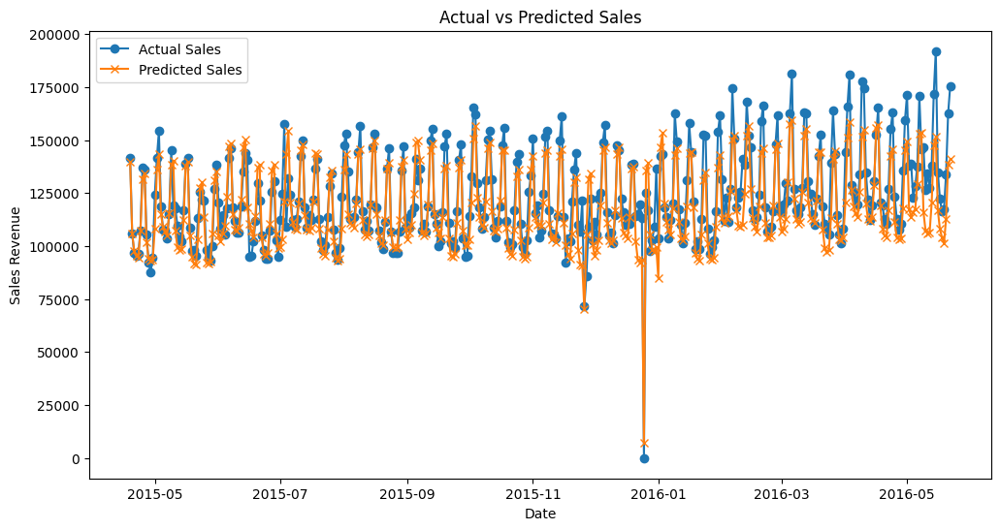

In [4]:
# Import necessary libraries
import pandas as pd
from prophet import Prophet
from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_absolute_percentage_error
import matplotlib.pyplot as plt
from itertools import product

# Function to load data
def load_data(train_path, test_path):
    try:
        sales_train_processed = pd.read_csv(train_path)
        sales_test_processed = pd.read_csv(test_path)
        return sales_train_processed, sales_test_processed
    except Exception as e:
        print(f"Error loading data: {e}")
        return None, None

# Function to preprocess data
def preprocess_data(sales_train, sales_test):
    sales_train['date'] = pd.to_datetime(sales_train['date'])
    sales_test['date'] = pd.to_datetime(sales_test['date'])

    daily_sales_train = sales_train.groupby('date')['revenue'].sum().reset_index()
    daily_sales_train.rename(columns={'date': 'ds', 'revenue': 'y'}, inplace=True)

    daily_sales_test = sales_test.groupby('date')['revenue'].sum().reset_index()
    daily_sales_test.rename(columns={'date': 'ds', 'revenue': 'y'}, inplace=True)

    return daily_sales_train, daily_sales_test

# Function to fit the Prophet model with U.S. holidays and custom seasonalities
def fit_prophet_model(train_data, add_seasonality=None, **params):
    model = Prophet(**params)
    model.add_country_holidays(country_name='US')  # Add U.S. holidays
    
    # Add custom seasonality
    if add_seasonality is not None:
        for seasonality in add_seasonality:
            model.add_seasonality(name=seasonality['name'], period=seasonality['period'], fourier_order=seasonality['fourier_order'])

    model.fit(train_data)
    return model

# Function to evaluate the model
def evaluate_model(test_data, forecast_data):
    mae = mean_absolute_error(test_data['y'], forecast_data['yhat'])
    rmse = mean_squared_error(test_data['y'], forecast_data['yhat'], squared=False)
    mape = mean_absolute_percentage_error(test_data['y'], forecast_data['yhat']) * 100

    return mae, rmse, mape

# Function to plot forecast
def plot_forecast(actual, forecast):
    plt.figure(figsize=(12, 6))
    plt.plot(actual['ds'], actual['y'], label='Actual Sales', marker='o')
    plt.plot(forecast['ds'], forecast['yhat'], label='Predicted Sales', marker='x')
    plt.title('Actual vs Predicted Sales')
    plt.xlabel('Date')
    plt.ylabel('Sales Revenue')
    plt.legend()
    plt.show()


# Define hyperparameters for tuning
changepoint_prior_scales = [0.001, 0.01, 0.1]
seasonality_modes = ['additive', 'multiplicative']
fourier_orders = [5, 7]
seasonalities = [
    {'name': 'monthly', 'period': 30.5, 'fourier_order': None},  # Fourier order will be set in the loop
    {'name': 'quarterly', 'period': 91.25, 'fourier_order': None}
]

best_mae = float('inf')
best_params = {}

# Perform hyperparameter tuning
for changepoint_prior_scale, seasonality_mode, fourier_order in product(changepoint_prior_scales, seasonality_modes, fourier_orders):
    print(f"Tuning parameters: changepoint_prior_scale={changepoint_prior_scale}, seasonality_mode={seasonality_mode}, fourier_order={fourier_order}")
    
    # Update Fourier order for seasonality
    for seasonality in seasonalities:
        seasonality['fourier_order'] = fourier_order

    # Fit the model with current parameters
    model = fit_prophet_model(daily_sales_train, add_seasonality=seasonalities, changepoint_prior_scale=changepoint_prior_scale, 
                               seasonality_mode=seasonality_mode)

    # Make predictions on the test set
    future_test = model.make_future_dataframe(periods=len(daily_sales_test), include_history=False)
    forecast_test = model.predict(future_test)

    # Evaluate the model
    forecast_test_filtered = forecast_test[['ds', 'yhat']].head(len(daily_sales_test))
    evaluation_df = pd.merge(daily_sales_test, forecast_test_filtered, on='ds')

    mae, rmse, mape = evaluate_model(evaluation_df, forecast_test_filtered)
    print(f"Mean Absolute Error (MAE): {mae}")
    print(f"Root Mean Squared Error (RMSE): {rmse}")
    print(f"Mean Absolute Percentage Error (MAPE): {mape:.2f}%")

    # Save best model based on MAE
    if mae < best_mae:
        best_mae = mae
        best_params = {
            'changepoint_prior_scale': changepoint_prior_scale,
            'seasonality_mode': seasonality_mode,
            'fourier_order': fourier_order
        }
        best_model = model

print(f"Best Parameters: {best_params}")

# Plot results
plot_forecast(daily_sales_test, forecast_test_filtered)

# Save the best model
# joblib.dump(best_model, 'prophet_sales_model_tuned.pkl')


Tuning parameters: changepoint_prior_scale=0.001, seasonality_mode=additive, holidays_prior_scale=1.0, fourier_order=5


11:29:16 - cmdstanpy - INFO - Chain [1] start processing
11:29:16 - cmdstanpy - INFO - Chain [1] done processing
/Users/alexanderschou/Library/Caches/pypoetry/virtualenvs/at2-experimentation-YINVk6u--py3.12/lib/python3.12/site-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Mean Absolute Error (MAE): 7637.69222045447
Root Mean Squared Error (RMSE): 10614.934916125805
Mean Absolute Percentage Error (MAPE): 112.70%


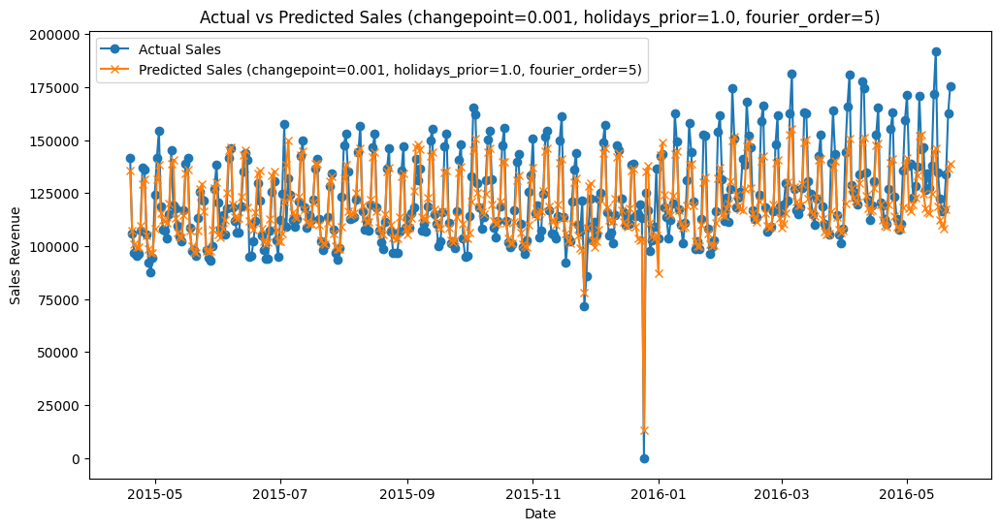

Tuning parameters: changepoint_prior_scale=0.001, seasonality_mode=additive, holidays_prior_scale=1.0, fourier_order=7


11:29:17 - cmdstanpy - INFO - Chain [1] start processing
11:29:17 - cmdstanpy - INFO - Chain [1] done processing
/Users/alexanderschou/Library/Caches/pypoetry/virtualenvs/at2-experimentation-YINVk6u--py3.12/lib/python3.12/site-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Mean Absolute Error (MAE): 7568.973055925217
Root Mean Squared Error (RMSE): 10673.634751022535
Mean Absolute Percentage Error (MAPE): 204.93%


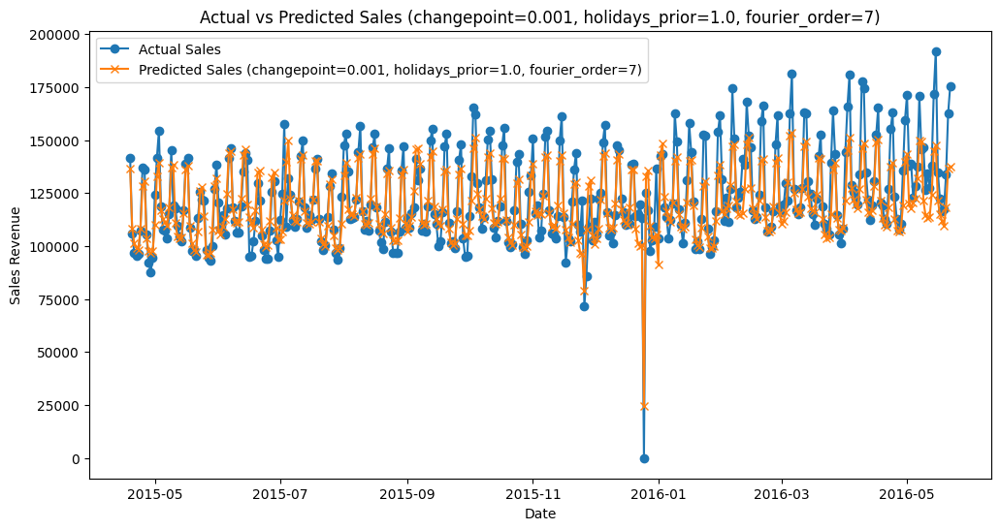

Tuning parameters: changepoint_prior_scale=0.001, seasonality_mode=additive, holidays_prior_scale=10.0, fourier_order=5


11:29:18 - cmdstanpy - INFO - Chain [1] start processing
11:29:19 - cmdstanpy - INFO - Chain [1] done processing
/Users/alexanderschou/Library/Caches/pypoetry/virtualenvs/at2-experimentation-YINVk6u--py3.12/lib/python3.12/site-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Mean Absolute Error (MAE): 7504.59444572884
Root Mean Squared Error (RMSE): 10416.840319457897
Mean Absolute Percentage Error (MAPE): 234.37%


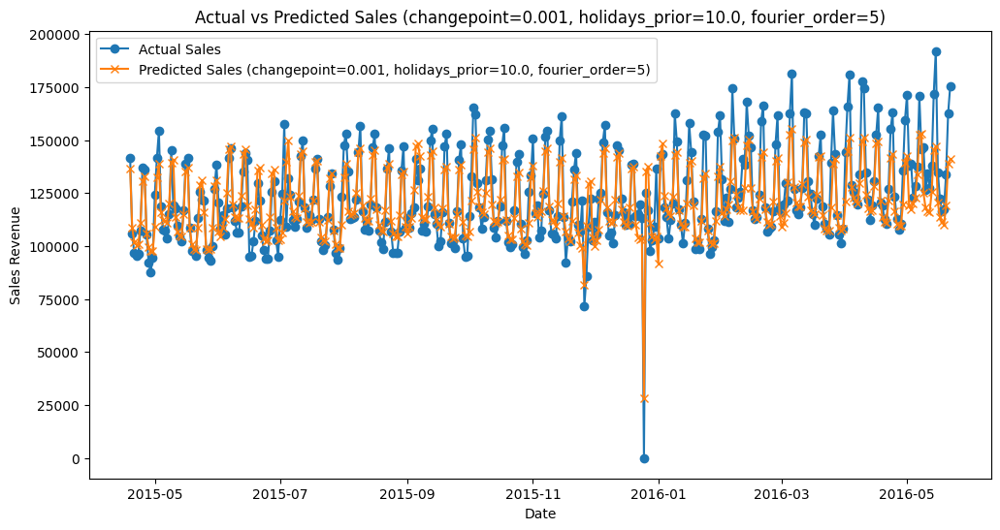

Tuning parameters: changepoint_prior_scale=0.001, seasonality_mode=additive, holidays_prior_scale=10.0, fourier_order=7


11:29:19 - cmdstanpy - INFO - Chain [1] start processing
11:29:20 - cmdstanpy - INFO - Chain [1] done processing
/Users/alexanderschou/Library/Caches/pypoetry/virtualenvs/at2-experimentation-YINVk6u--py3.12/lib/python3.12/site-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Mean Absolute Error (MAE): 7612.7945335882905
Root Mean Squared Error (RMSE): 10725.74687319736
Mean Absolute Percentage Error (MAPE): 181.89%


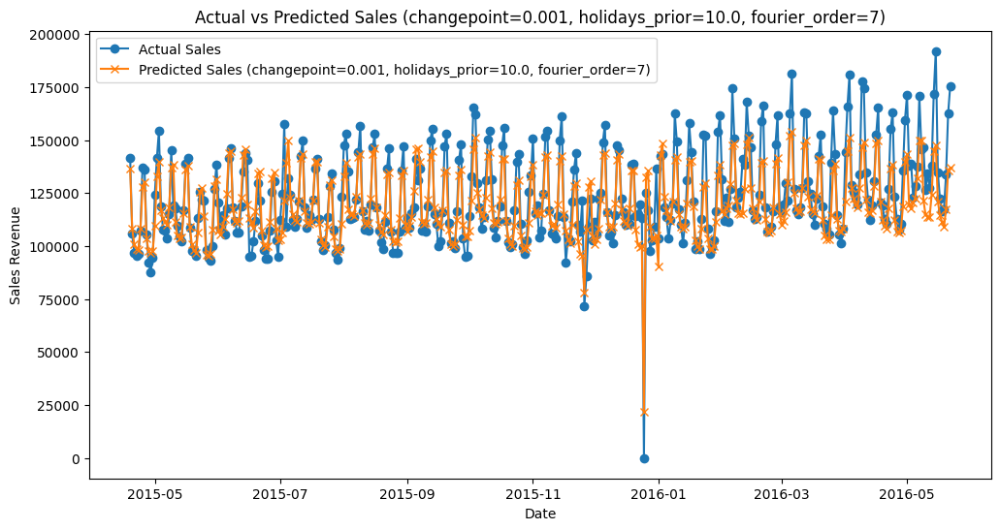

Tuning parameters: changepoint_prior_scale=0.001, seasonality_mode=additive, holidays_prior_scale=100.0, fourier_order=5


11:29:21 - cmdstanpy - INFO - Chain [1] start processing
11:29:21 - cmdstanpy - INFO - Chain [1] done processing
/Users/alexanderschou/Library/Caches/pypoetry/virtualenvs/at2-experimentation-YINVk6u--py3.12/lib/python3.12/site-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Mean Absolute Error (MAE): 7539.199083542317
Root Mean Squared Error (RMSE): 10480.325054144565
Mean Absolute Percentage Error (MAPE): 265.36%


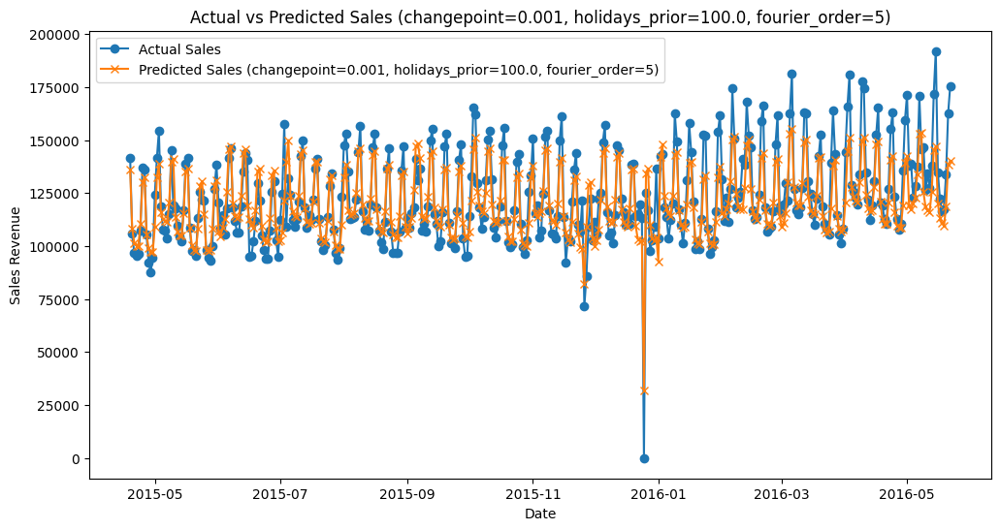

Tuning parameters: changepoint_prior_scale=0.001, seasonality_mode=additive, holidays_prior_scale=100.0, fourier_order=7


11:29:22 - cmdstanpy - INFO - Chain [1] start processing
11:29:22 - cmdstanpy - INFO - Chain [1] done processing
/Users/alexanderschou/Library/Caches/pypoetry/virtualenvs/at2-experimentation-YINVk6u--py3.12/lib/python3.12/site-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Mean Absolute Error (MAE): 7475.835856132887
Root Mean Squared Error (RMSE): 10583.006373374352
Mean Absolute Percentage Error (MAPE): 307.21%


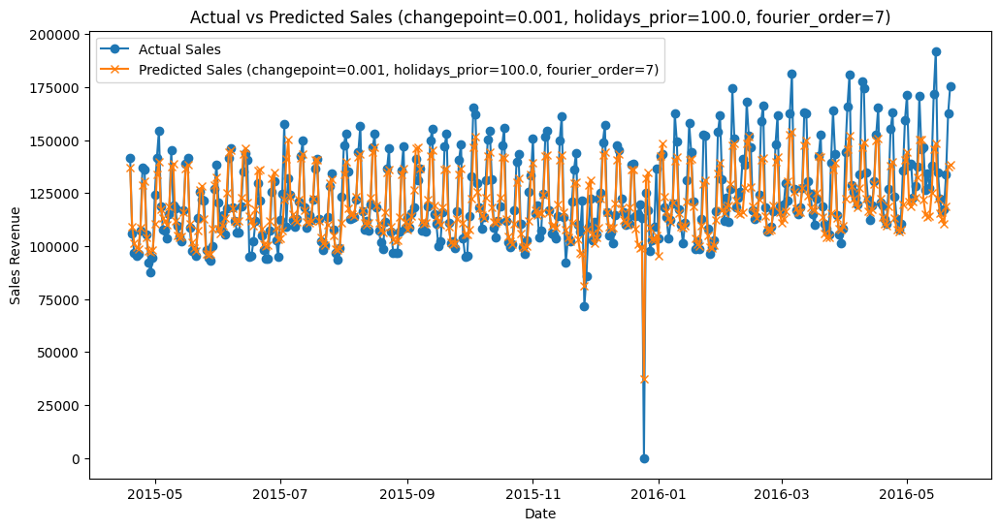

Tuning parameters: changepoint_prior_scale=0.001, seasonality_mode=additive, holidays_prior_scale=10000.0, fourier_order=5


11:29:23 - cmdstanpy - INFO - Chain [1] start processing
11:29:24 - cmdstanpy - INFO - Chain [1] done processing
/Users/alexanderschou/Library/Caches/pypoetry/virtualenvs/at2-experimentation-YINVk6u--py3.12/lib/python3.12/site-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Mean Absolute Error (MAE): 7514.926906494685
Root Mean Squared Error (RMSE): 10466.613488496732
Mean Absolute Percentage Error (MAPE): 245.90%


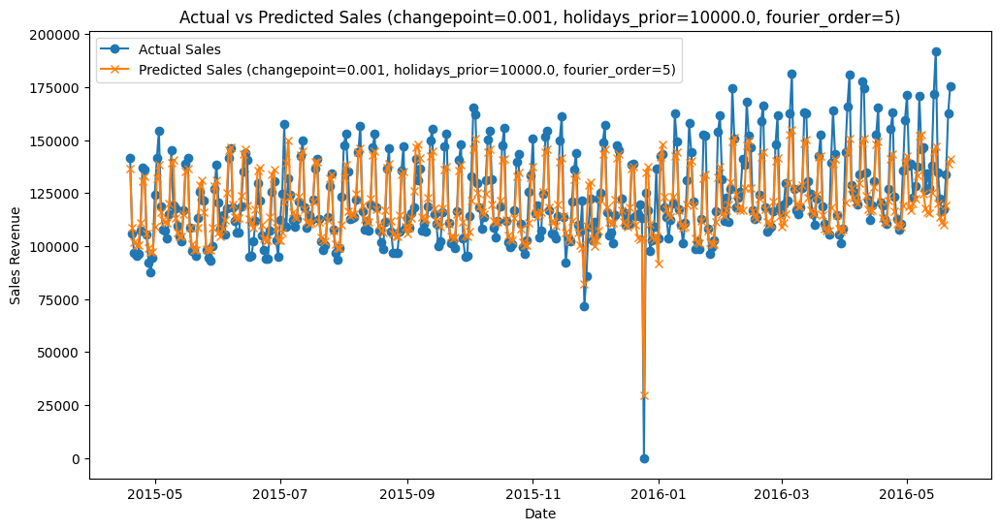

Tuning parameters: changepoint_prior_scale=0.001, seasonality_mode=additive, holidays_prior_scale=10000.0, fourier_order=7


11:29:24 - cmdstanpy - INFO - Chain [1] start processing
11:29:25 - cmdstanpy - INFO - Chain [1] done processing
/Users/alexanderschou/Library/Caches/pypoetry/virtualenvs/at2-experimentation-YINVk6u--py3.12/lib/python3.12/site-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Mean Absolute Error (MAE): 7552.087106372786
Root Mean Squared Error (RMSE): 10679.541750389946
Mean Absolute Percentage Error (MAPE): 267.21%


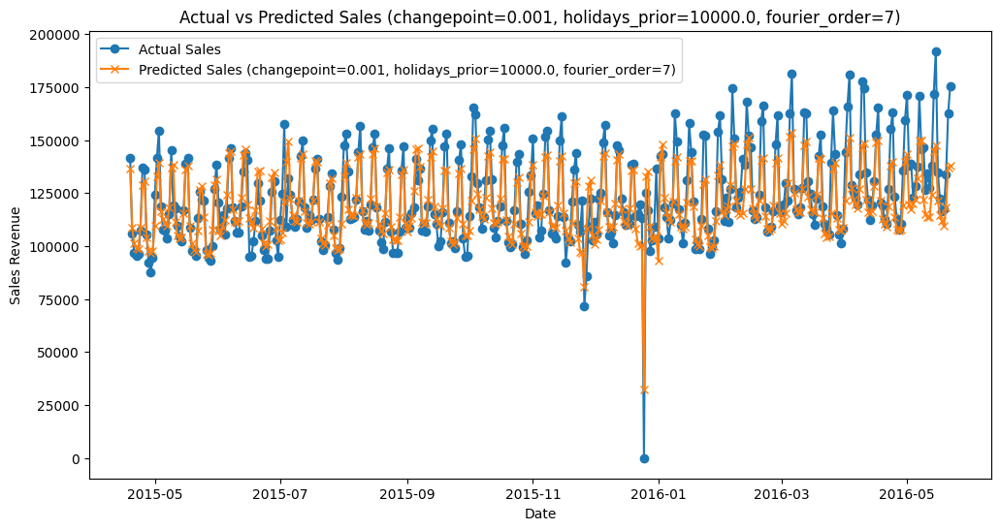

Tuning parameters: changepoint_prior_scale=0.001, seasonality_mode=multiplicative, holidays_prior_scale=1.0, fourier_order=5


11:29:25 - cmdstanpy - INFO - Chain [1] start processing
11:29:26 - cmdstanpy - INFO - Chain [1] done processing
/Users/alexanderschou/Library/Caches/pypoetry/virtualenvs/at2-experimentation-YINVk6u--py3.12/lib/python3.12/site-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Mean Absolute Error (MAE): 7317.492229227042
Root Mean Squared Error (RMSE): 11191.103817495119
Mean Absolute Percentage Error (MAPE): 842.48%


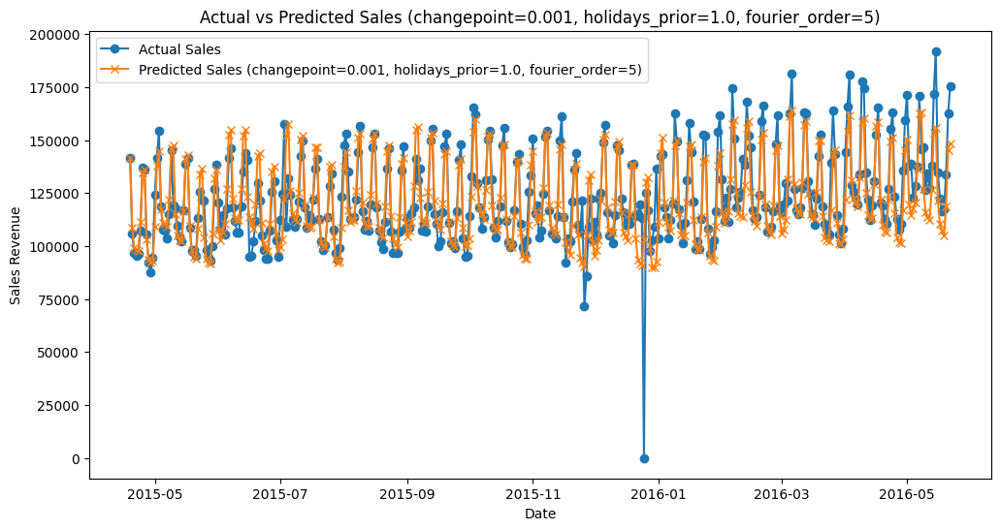

Tuning parameters: changepoint_prior_scale=0.001, seasonality_mode=multiplicative, holidays_prior_scale=1.0, fourier_order=7


11:29:26 - cmdstanpy - INFO - Chain [1] start processing
11:29:27 - cmdstanpy - INFO - Chain [1] done processing
/Users/alexanderschou/Library/Caches/pypoetry/virtualenvs/at2-experimentation-YINVk6u--py3.12/lib/python3.12/site-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Mean Absolute Error (MAE): 7280.599420454456
Root Mean Squared Error (RMSE): 11100.12333452857
Mean Absolute Percentage Error (MAPE): 836.41%


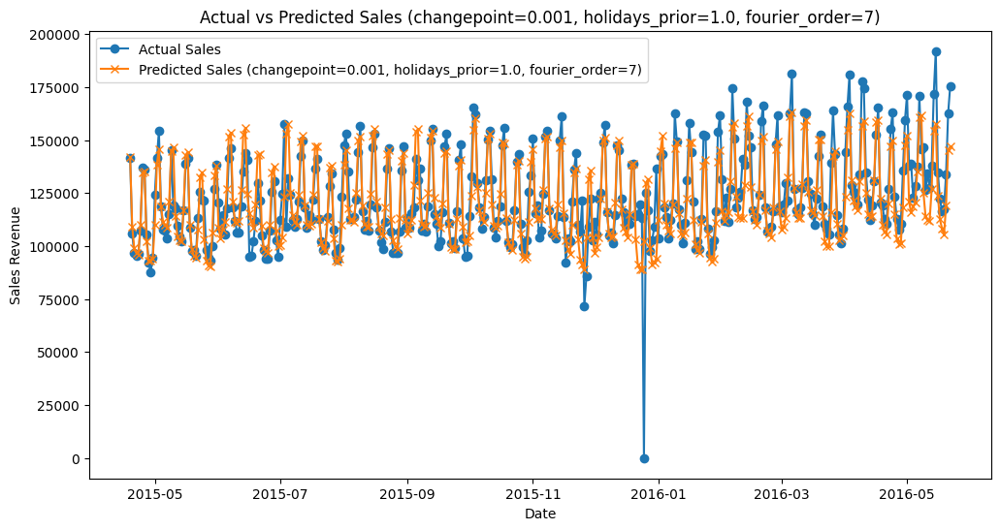

Tuning parameters: changepoint_prior_scale=0.001, seasonality_mode=multiplicative, holidays_prior_scale=10.0, fourier_order=5


11:29:27 - cmdstanpy - INFO - Chain [1] start processing
11:29:28 - cmdstanpy - INFO - Chain [1] done processing
/Users/alexanderschou/Library/Caches/pypoetry/virtualenvs/at2-experimentation-YINVk6u--py3.12/lib/python3.12/site-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Mean Absolute Error (MAE): 7327.3201269806505
Root Mean Squared Error (RMSE): 11187.549777977461
Mean Absolute Percentage Error (MAPE): 838.48%


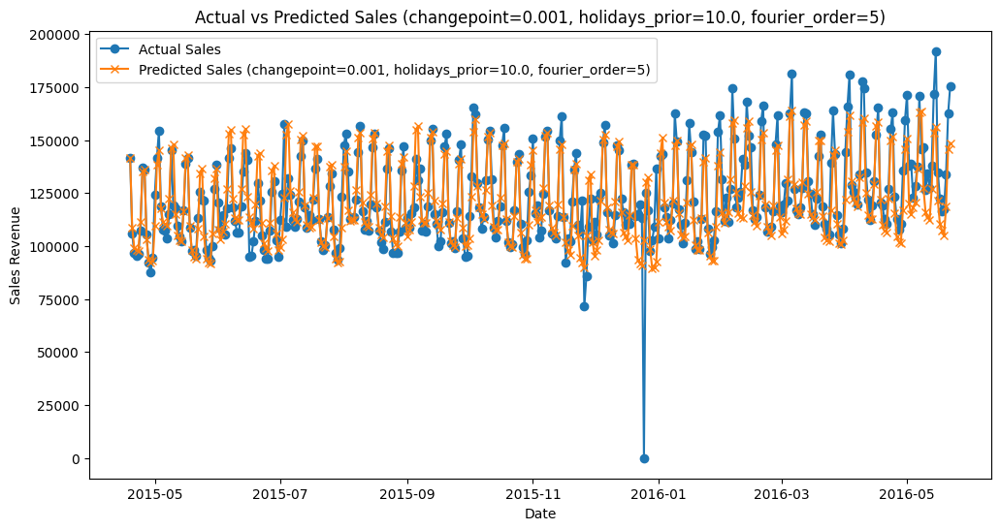

Tuning parameters: changepoint_prior_scale=0.001, seasonality_mode=multiplicative, holidays_prior_scale=10.0, fourier_order=7


11:29:28 - cmdstanpy - INFO - Chain [1] start processing
11:29:29 - cmdstanpy - INFO - Chain [1] done processing
/Users/alexanderschou/Library/Caches/pypoetry/virtualenvs/at2-experimentation-YINVk6u--py3.12/lib/python3.12/site-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Mean Absolute Error (MAE): 7288.494903457891
Root Mean Squared Error (RMSE): 11108.439603396548
Mean Absolute Percentage Error (MAPE): 836.09%


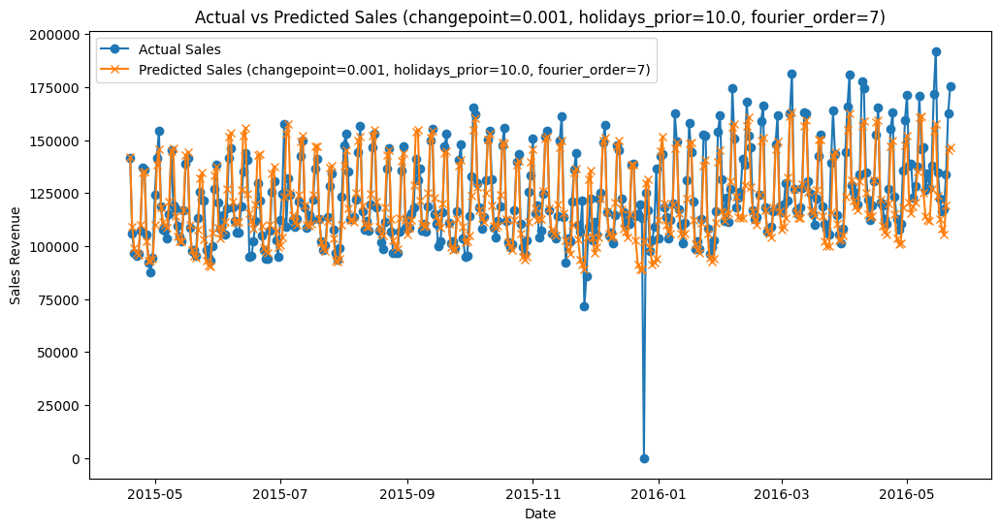

Tuning parameters: changepoint_prior_scale=0.001, seasonality_mode=multiplicative, holidays_prior_scale=100.0, fourier_order=5


11:29:29 - cmdstanpy - INFO - Chain [1] start processing
11:29:29 - cmdstanpy - INFO - Chain [1] done processing
/Users/alexanderschou/Library/Caches/pypoetry/virtualenvs/at2-experimentation-YINVk6u--py3.12/lib/python3.12/site-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Mean Absolute Error (MAE): 7317.854963720927
Root Mean Squared Error (RMSE): 11191.556004644084
Mean Absolute Percentage Error (MAPE): 842.45%


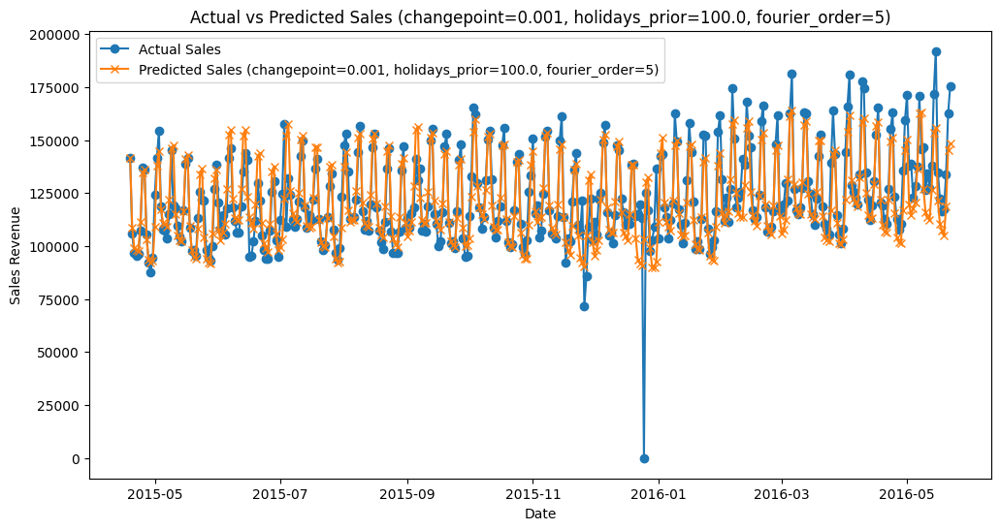

Tuning parameters: changepoint_prior_scale=0.001, seasonality_mode=multiplicative, holidays_prior_scale=100.0, fourier_order=7


11:29:30 - cmdstanpy - INFO - Chain [1] start processing
11:29:30 - cmdstanpy - INFO - Chain [1] done processing
/Users/alexanderschou/Library/Caches/pypoetry/virtualenvs/at2-experimentation-YINVk6u--py3.12/lib/python3.12/site-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Mean Absolute Error (MAE): 7283.3878263118595
Root Mean Squared Error (RMSE): 11103.110639858487
Mean Absolute Percentage Error (MAPE): 836.29%


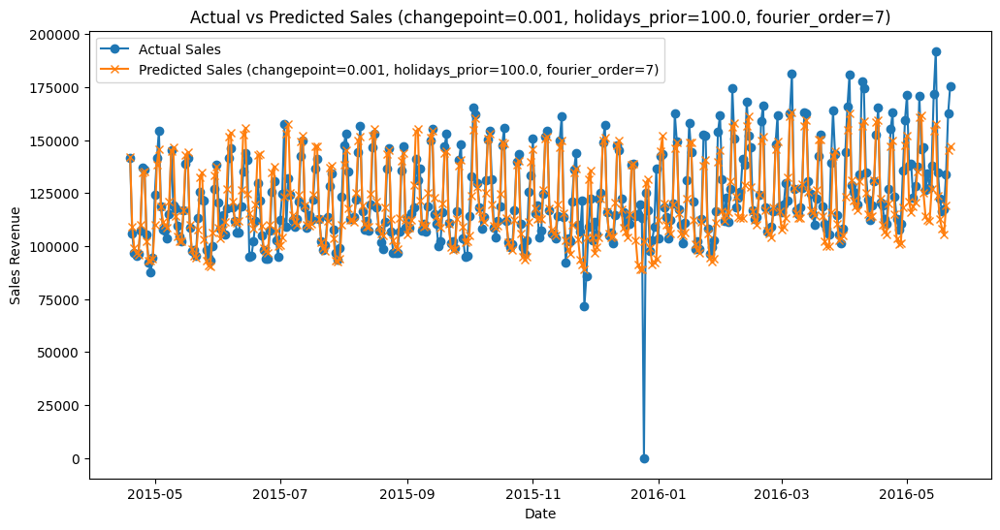

Tuning parameters: changepoint_prior_scale=0.001, seasonality_mode=multiplicative, holidays_prior_scale=10000.0, fourier_order=5


11:29:31 - cmdstanpy - INFO - Chain [1] start processing
11:29:31 - cmdstanpy - INFO - Chain [1] done processing
/Users/alexanderschou/Library/Caches/pypoetry/virtualenvs/at2-experimentation-YINVk6u--py3.12/lib/python3.12/site-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Mean Absolute Error (MAE): 7317.509571479389
Root Mean Squared Error (RMSE): 11191.130164023984
Mean Absolute Percentage Error (MAPE): 842.48%


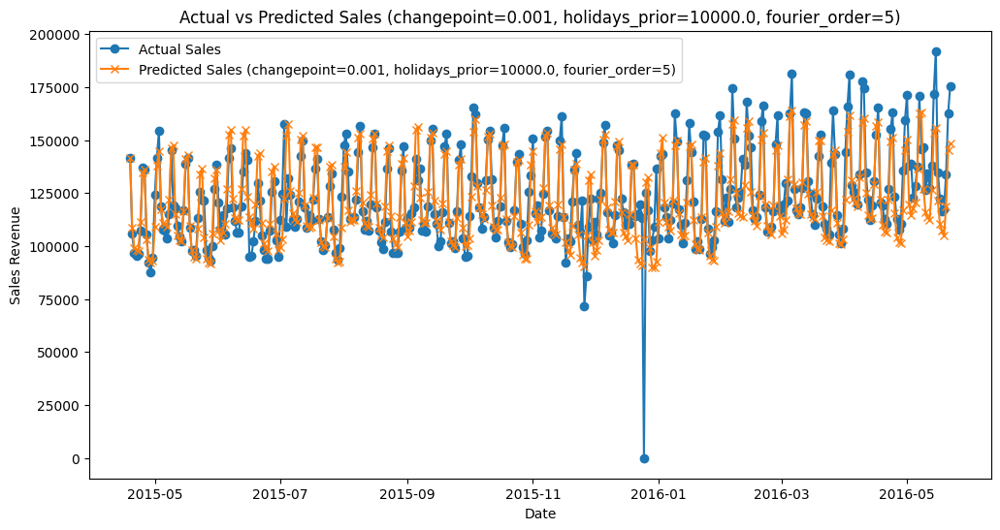

Tuning parameters: changepoint_prior_scale=0.001, seasonality_mode=multiplicative, holidays_prior_scale=10000.0, fourier_order=7


11:29:32 - cmdstanpy - INFO - Chain [1] start processing
11:29:32 - cmdstanpy - INFO - Chain [1] done processing
/Users/alexanderschou/Library/Caches/pypoetry/virtualenvs/at2-experimentation-YINVk6u--py3.12/lib/python3.12/site-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Mean Absolute Error (MAE): 7284.0650602335645
Root Mean Squared Error (RMSE): 11103.789841222093
Mean Absolute Percentage Error (MAPE): 836.26%


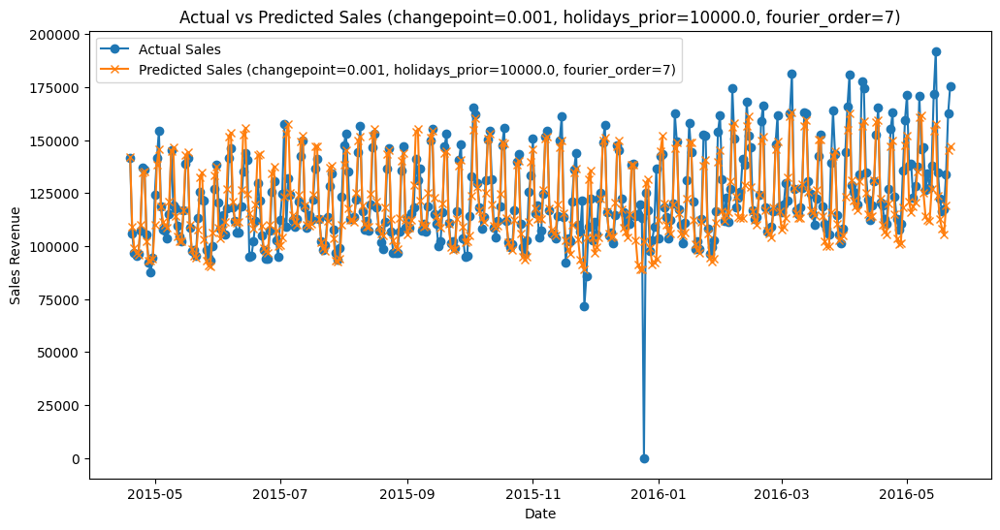

Tuning parameters: changepoint_prior_scale=0.01, seasonality_mode=additive, holidays_prior_scale=1.0, fourier_order=5


11:29:33 - cmdstanpy - INFO - Chain [1] start processing
11:29:33 - cmdstanpy - INFO - Chain [1] done processing
/Users/alexanderschou/Library/Caches/pypoetry/virtualenvs/at2-experimentation-YINVk6u--py3.12/lib/python3.12/site-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Mean Absolute Error (MAE): 9862.673330110989
Root Mean Squared Error (RMSE): 13364.518808508743
Mean Absolute Percentage Error (MAPE): 180.33%


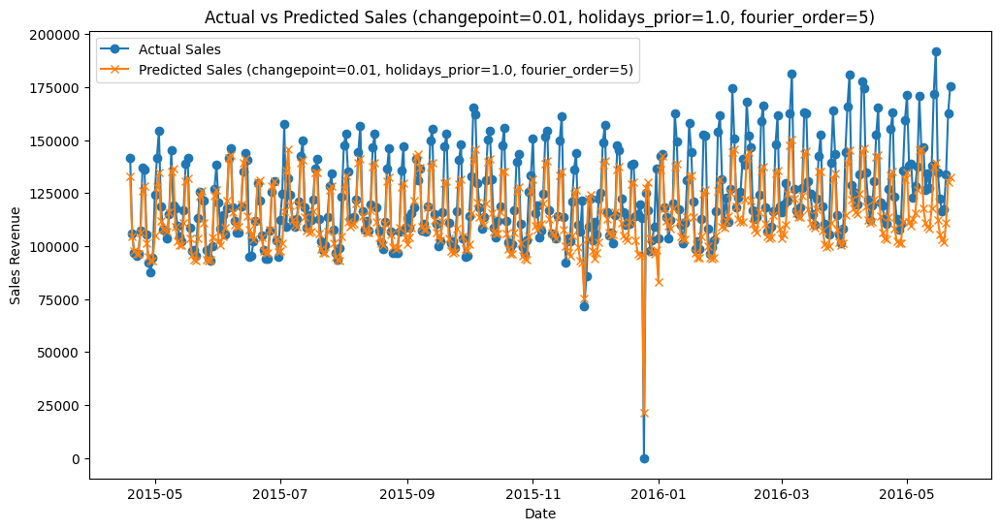

Tuning parameters: changepoint_prior_scale=0.01, seasonality_mode=additive, holidays_prior_scale=1.0, fourier_order=7


11:29:34 - cmdstanpy - INFO - Chain [1] start processing
11:29:34 - cmdstanpy - INFO - Chain [1] done processing
/Users/alexanderschou/Library/Caches/pypoetry/virtualenvs/at2-experimentation-YINVk6u--py3.12/lib/python3.12/site-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Mean Absolute Error (MAE): 9809.22112878411
Root Mean Squared Error (RMSE): 13255.40407852788
Mean Absolute Percentage Error (MAPE): 169.95%


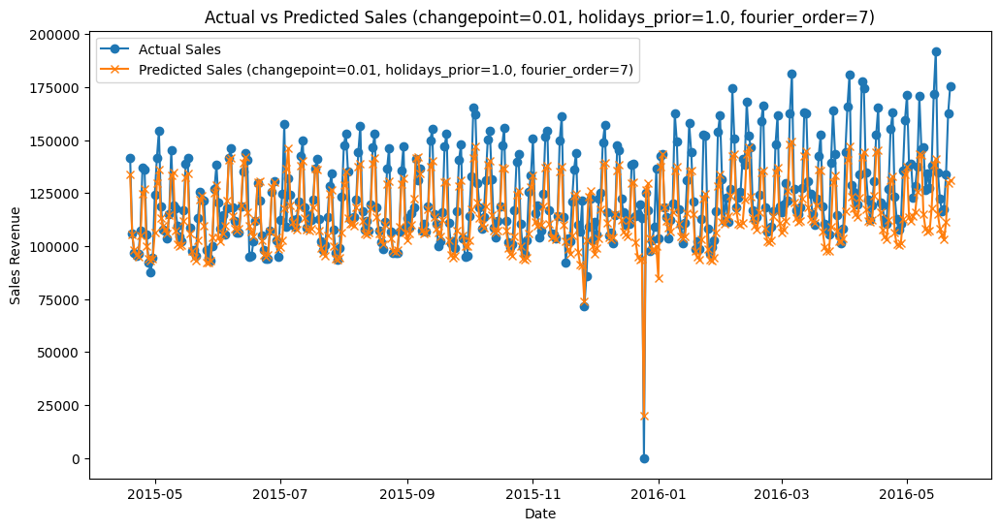

Tuning parameters: changepoint_prior_scale=0.01, seasonality_mode=additive, holidays_prior_scale=10.0, fourier_order=5


11:29:35 - cmdstanpy - INFO - Chain [1] start processing
11:29:35 - cmdstanpy - INFO - Chain [1] done processing
/Users/alexanderschou/Library/Caches/pypoetry/virtualenvs/at2-experimentation-YINVk6u--py3.12/lib/python3.12/site-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Mean Absolute Error (MAE): 9927.281805464487
Root Mean Squared Error (RMSE): 13426.534698183643
Mean Absolute Percentage Error (MAPE): 180.27%


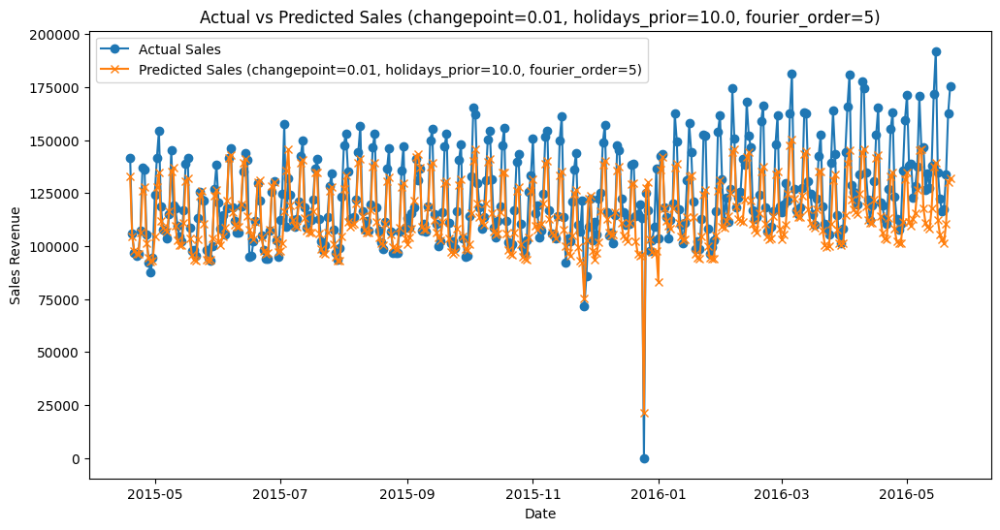

Tuning parameters: changepoint_prior_scale=0.01, seasonality_mode=additive, holidays_prior_scale=10.0, fourier_order=7


11:29:36 - cmdstanpy - INFO - Chain [1] start processing
11:29:36 - cmdstanpy - INFO - Chain [1] done processing
/Users/alexanderschou/Library/Caches/pypoetry/virtualenvs/at2-experimentation-YINVk6u--py3.12/lib/python3.12/site-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Mean Absolute Error (MAE): 9873.482101379675
Root Mean Squared Error (RMSE): 13319.824654269436
Mean Absolute Percentage Error (MAPE): 154.58%


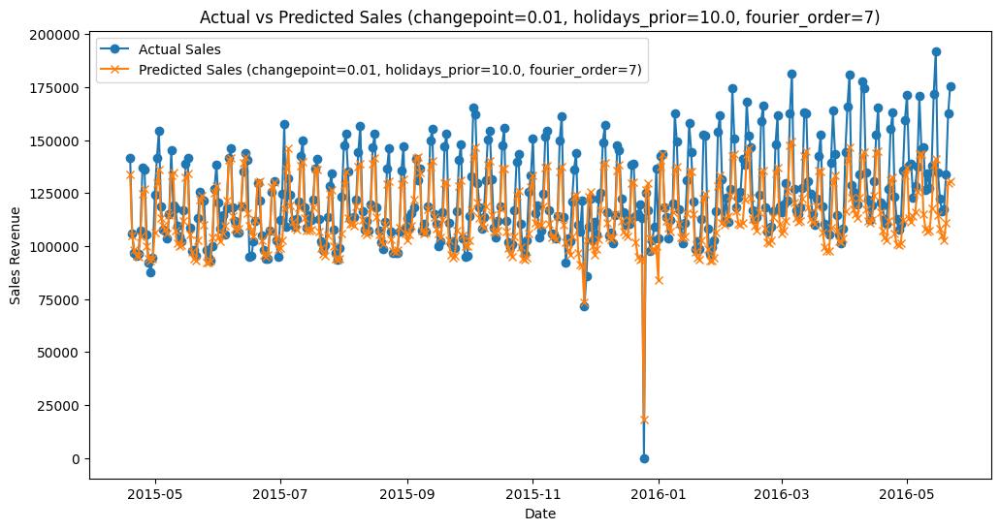

Tuning parameters: changepoint_prior_scale=0.01, seasonality_mode=additive, holidays_prior_scale=100.0, fourier_order=5


11:29:36 - cmdstanpy - INFO - Chain [1] start processing
11:29:36 - cmdstanpy - INFO - Chain [1] done processing
/Users/alexanderschou/Library/Caches/pypoetry/virtualenvs/at2-experimentation-YINVk6u--py3.12/lib/python3.12/site-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Mean Absolute Error (MAE): 9954.469398171059
Root Mean Squared Error (RMSE): 13455.939793028387
Mean Absolute Percentage Error (MAPE): 178.77%


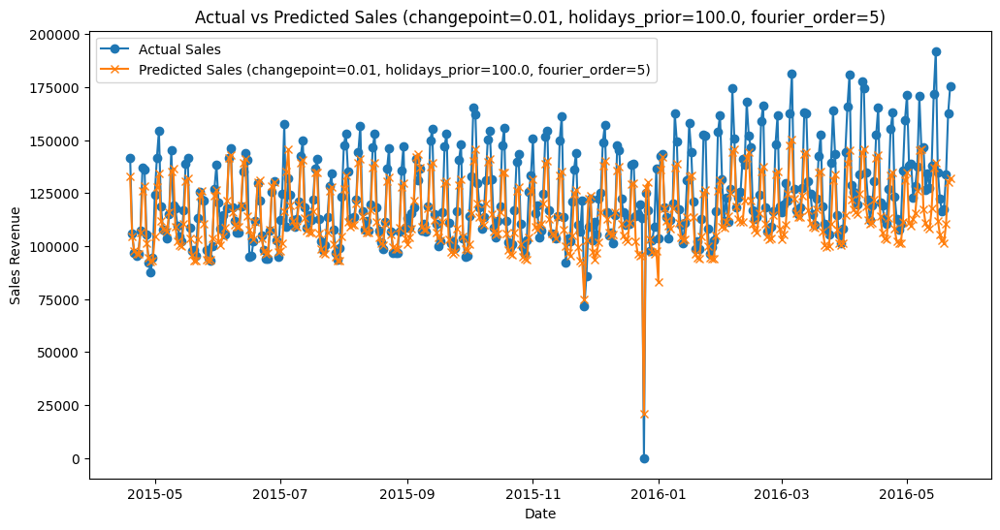

Tuning parameters: changepoint_prior_scale=0.01, seasonality_mode=additive, holidays_prior_scale=100.0, fourier_order=7


11:29:37 - cmdstanpy - INFO - Chain [1] start processing
11:29:38 - cmdstanpy - INFO - Chain [1] done processing
/Users/alexanderschou/Library/Caches/pypoetry/virtualenvs/at2-experimentation-YINVk6u--py3.12/lib/python3.12/site-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Mean Absolute Error (MAE): 9910.59096526481
Root Mean Squared Error (RMSE): 13356.781483774754
Mean Absolute Percentage Error (MAPE): 166.29%


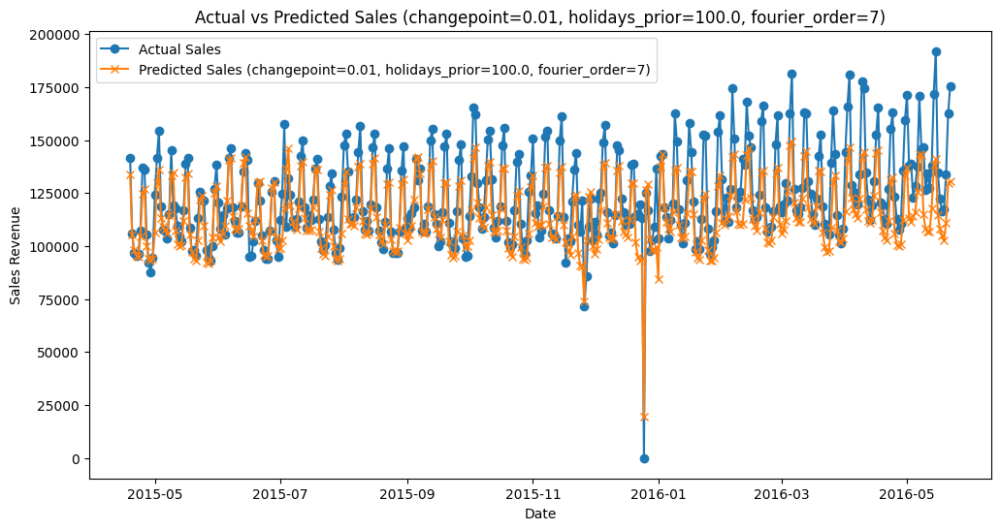

Tuning parameters: changepoint_prior_scale=0.01, seasonality_mode=additive, holidays_prior_scale=10000.0, fourier_order=5


11:29:38 - cmdstanpy - INFO - Chain [1] start processing
11:29:38 - cmdstanpy - INFO - Chain [1] done processing
/Users/alexanderschou/Library/Caches/pypoetry/virtualenvs/at2-experimentation-YINVk6u--py3.12/lib/python3.12/site-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Mean Absolute Error (MAE): 9893.870748177464
Root Mean Squared Error (RMSE): 13396.195905525612
Mean Absolute Percentage Error (MAPE): 181.41%


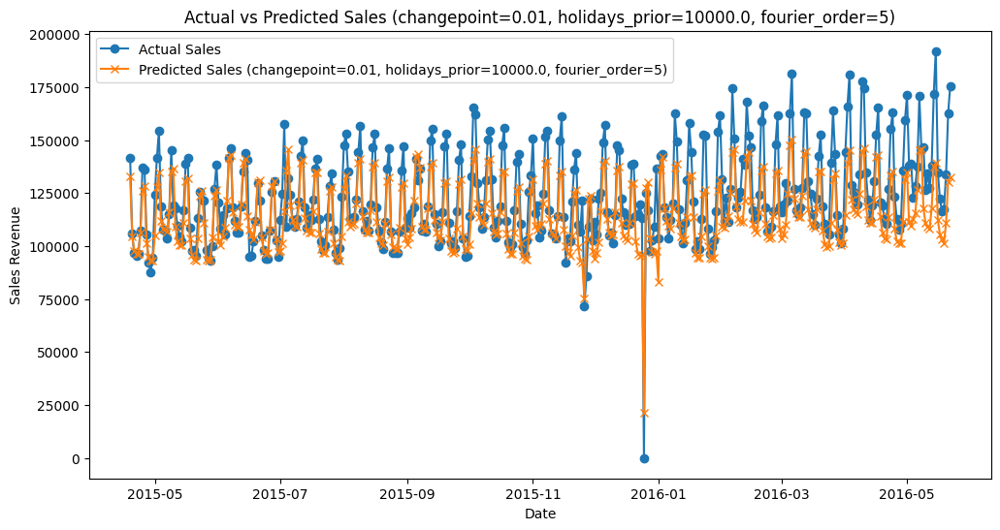

Tuning parameters: changepoint_prior_scale=0.01, seasonality_mode=additive, holidays_prior_scale=10000.0, fourier_order=7


11:29:39 - cmdstanpy - INFO - Chain [1] start processing
11:29:39 - cmdstanpy - INFO - Chain [1] done processing
/Users/alexanderschou/Library/Caches/pypoetry/virtualenvs/at2-experimentation-YINVk6u--py3.12/lib/python3.12/site-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Mean Absolute Error (MAE): 9900.918261388688
Root Mean Squared Error (RMSE): 13347.392606383592
Mean Absolute Percentage Error (MAPE): 166.95%


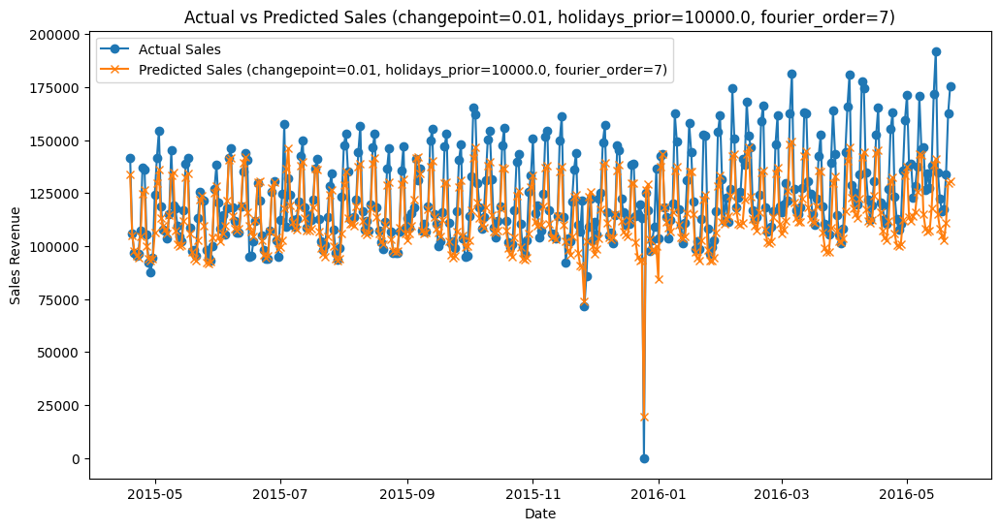

Tuning parameters: changepoint_prior_scale=0.01, seasonality_mode=multiplicative, holidays_prior_scale=1.0, fourier_order=5


11:29:40 - cmdstanpy - INFO - Chain [1] start processing
11:29:40 - cmdstanpy - INFO - Chain [1] done processing
/Users/alexanderschou/Library/Caches/pypoetry/virtualenvs/at2-experimentation-YINVk6u--py3.12/lib/python3.12/site-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Mean Absolute Error (MAE): 9954.798358797496
Root Mean Squared Error (RMSE): 12941.202353107044
Mean Absolute Percentage Error (MAPE): 84.13%


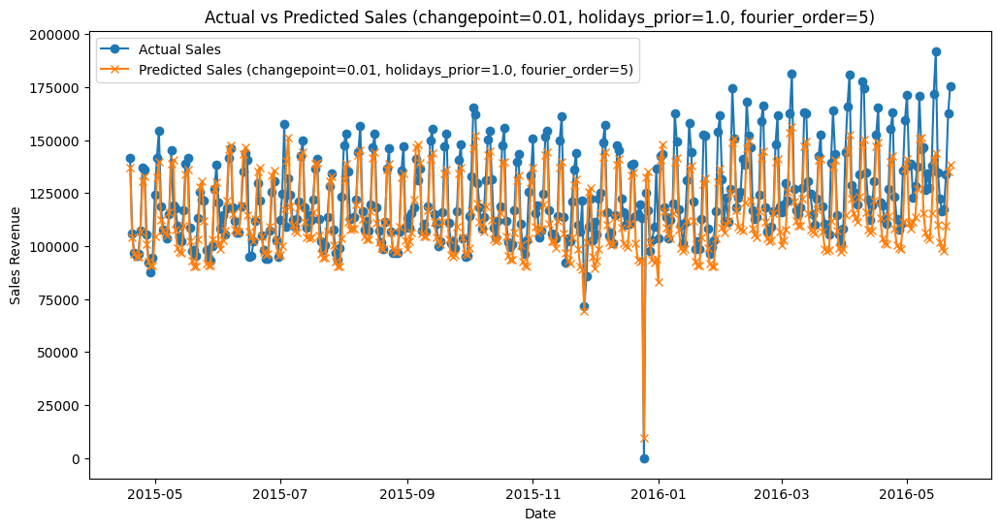

Tuning parameters: changepoint_prior_scale=0.01, seasonality_mode=multiplicative, holidays_prior_scale=1.0, fourier_order=7


11:29:41 - cmdstanpy - INFO - Chain [1] start processing
11:29:41 - cmdstanpy - INFO - Chain [1] done processing
/Users/alexanderschou/Library/Caches/pypoetry/virtualenvs/at2-experimentation-YINVk6u--py3.12/lib/python3.12/site-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Mean Absolute Error (MAE): 9918.594449920502
Root Mean Squared Error (RMSE): 12824.732925956434
Mean Absolute Percentage Error (MAPE): 66.72%


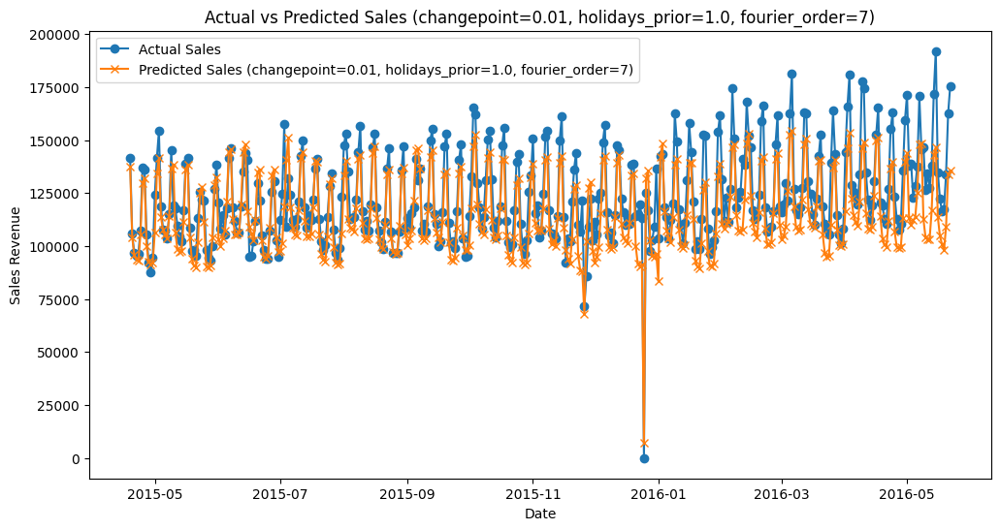

Tuning parameters: changepoint_prior_scale=0.01, seasonality_mode=multiplicative, holidays_prior_scale=10.0, fourier_order=5


11:29:42 - cmdstanpy - INFO - Chain [1] start processing
11:29:42 - cmdstanpy - INFO - Chain [1] done processing
/Users/alexanderschou/Library/Caches/pypoetry/virtualenvs/at2-experimentation-YINVk6u--py3.12/lib/python3.12/site-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Mean Absolute Error (MAE): 9973.212515942037
Root Mean Squared Error (RMSE): 12955.225728821333
Mean Absolute Percentage Error (MAPE): 52.76%


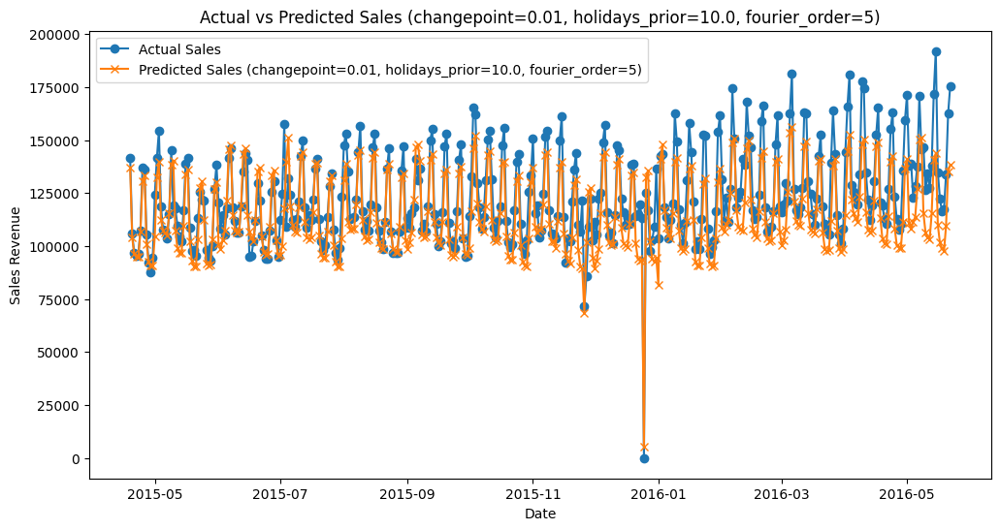

Tuning parameters: changepoint_prior_scale=0.01, seasonality_mode=multiplicative, holidays_prior_scale=10.0, fourier_order=7


11:29:43 - cmdstanpy - INFO - Chain [1] start processing
11:29:43 - cmdstanpy - INFO - Chain [1] done processing
/Users/alexanderschou/Library/Caches/pypoetry/virtualenvs/at2-experimentation-YINVk6u--py3.12/lib/python3.12/site-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Mean Absolute Error (MAE): 9957.306778439444
Root Mean Squared Error (RMSE): 12864.388423139591
Mean Absolute Percentage Error (MAPE): 62.13%


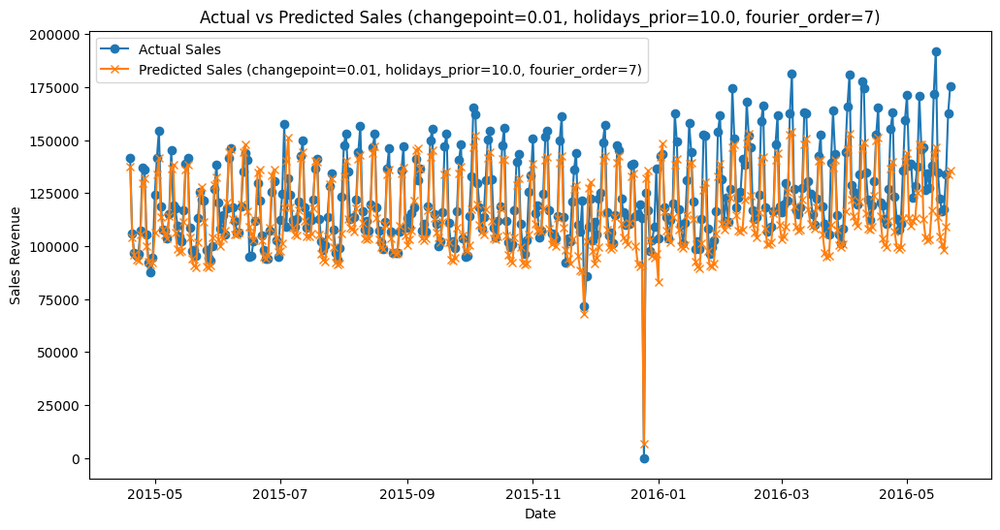

Tuning parameters: changepoint_prior_scale=0.01, seasonality_mode=multiplicative, holidays_prior_scale=100.0, fourier_order=5


11:29:44 - cmdstanpy - INFO - Chain [1] start processing
11:29:44 - cmdstanpy - INFO - Chain [1] done processing
/Users/alexanderschou/Library/Caches/pypoetry/virtualenvs/at2-experimentation-YINVk6u--py3.12/lib/python3.12/site-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Mean Absolute Error (MAE): 9951.365436793332
Root Mean Squared Error (RMSE): 12934.96089678087
Mean Absolute Percentage Error (MAPE): 69.71%


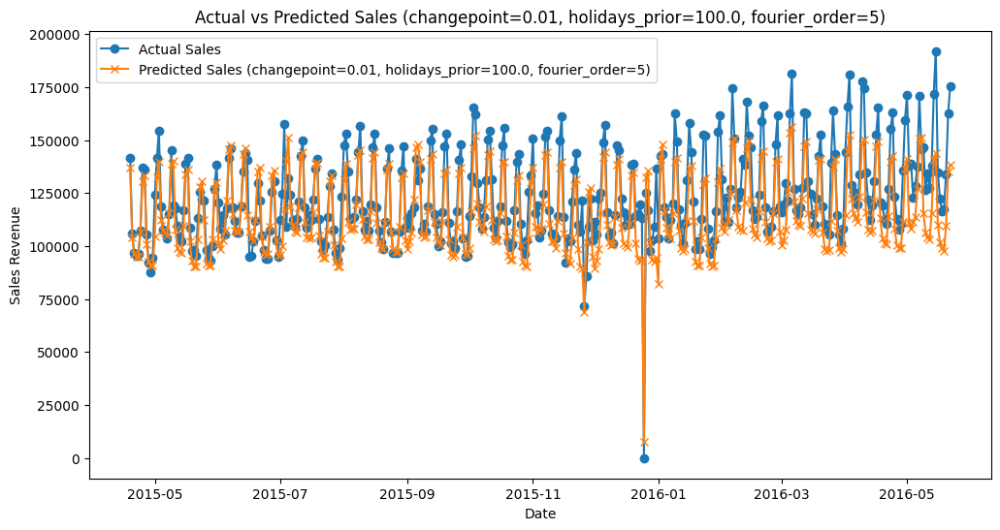

Tuning parameters: changepoint_prior_scale=0.01, seasonality_mode=multiplicative, holidays_prior_scale=100.0, fourier_order=7


11:29:45 - cmdstanpy - INFO - Chain [1] start processing
11:29:45 - cmdstanpy - INFO - Chain [1] done processing
/Users/alexanderschou/Library/Caches/pypoetry/virtualenvs/at2-experimentation-YINVk6u--py3.12/lib/python3.12/site-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Mean Absolute Error (MAE): 9949.638390248918
Root Mean Squared Error (RMSE): 12844.022105728576
Mean Absolute Percentage Error (MAPE): 106.86%


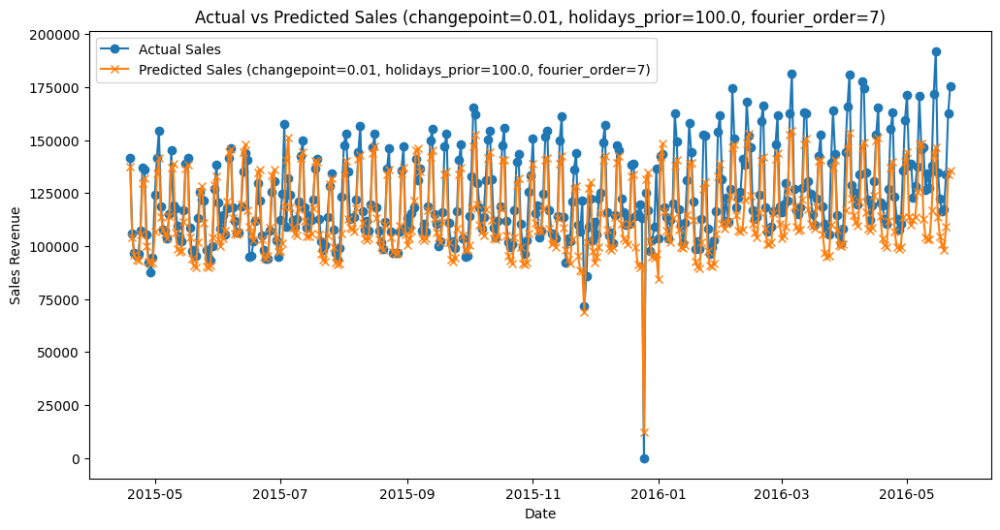

Tuning parameters: changepoint_prior_scale=0.01, seasonality_mode=multiplicative, holidays_prior_scale=10000.0, fourier_order=5


11:29:46 - cmdstanpy - INFO - Chain [1] start processing
11:29:46 - cmdstanpy - INFO - Chain [1] done processing
/Users/alexanderschou/Library/Caches/pypoetry/virtualenvs/at2-experimentation-YINVk6u--py3.12/lib/python3.12/site-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Mean Absolute Error (MAE): 9817.680715304241
Root Mean Squared Error (RMSE): 12800.537416693518
Mean Absolute Percentage Error (MAPE): 74.33%


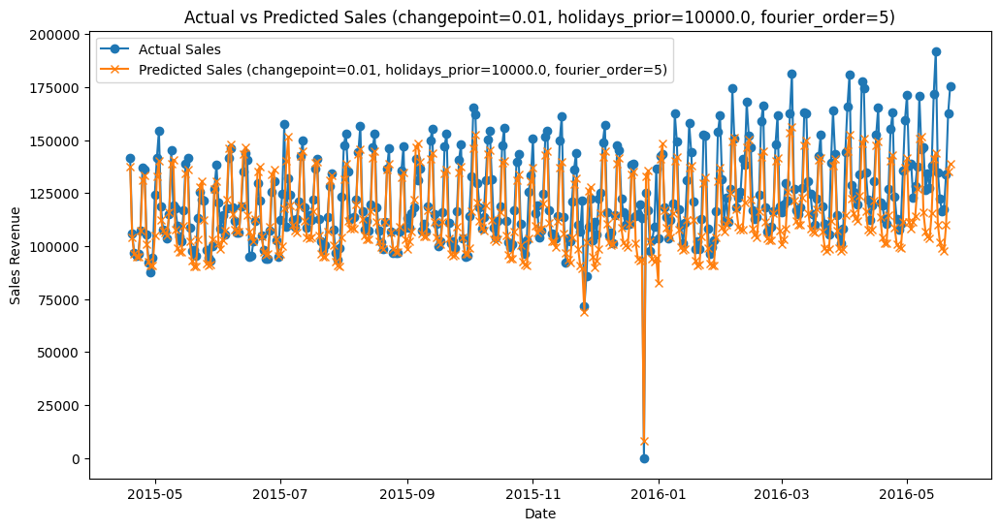

Tuning parameters: changepoint_prior_scale=0.01, seasonality_mode=multiplicative, holidays_prior_scale=10000.0, fourier_order=7


11:29:47 - cmdstanpy - INFO - Chain [1] start processing
11:29:47 - cmdstanpy - INFO - Chain [1] done processing
/Users/alexanderschou/Library/Caches/pypoetry/virtualenvs/at2-experimentation-YINVk6u--py3.12/lib/python3.12/site-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Mean Absolute Error (MAE): 9886.378314262452
Root Mean Squared Error (RMSE): 12788.68065010593
Mean Absolute Percentage Error (MAPE): 99.38%


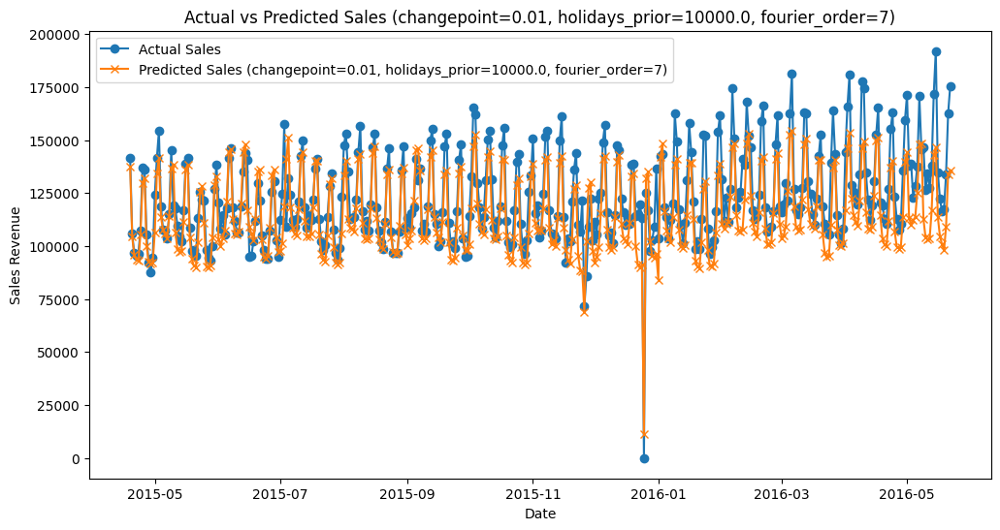

Tuning parameters: changepoint_prior_scale=0.1, seasonality_mode=additive, holidays_prior_scale=1.0, fourier_order=5


11:29:48 - cmdstanpy - INFO - Chain [1] start processing
11:29:48 - cmdstanpy - INFO - Chain [1] done processing
/Users/alexanderschou/Library/Caches/pypoetry/virtualenvs/at2-experimentation-YINVk6u--py3.12/lib/python3.12/site-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Mean Absolute Error (MAE): 8421.39963538658
Root Mean Squared Error (RMSE): 11781.341994016831
Mean Absolute Percentage Error (MAPE): 203.29%


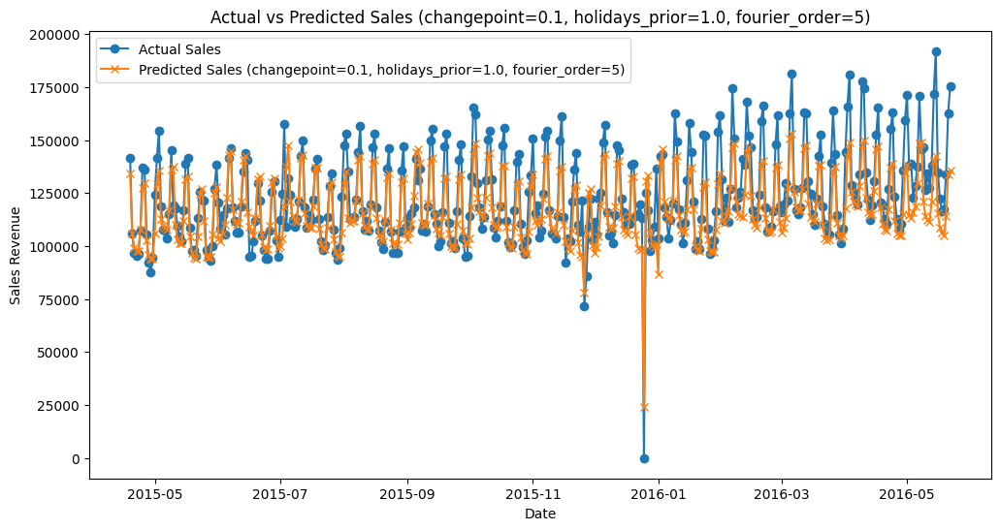

Tuning parameters: changepoint_prior_scale=0.1, seasonality_mode=additive, holidays_prior_scale=1.0, fourier_order=7


11:29:49 - cmdstanpy - INFO - Chain [1] start processing
11:29:50 - cmdstanpy - INFO - Chain [1] done processing
/Users/alexanderschou/Library/Caches/pypoetry/virtualenvs/at2-experimentation-YINVk6u--py3.12/lib/python3.12/site-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Mean Absolute Error (MAE): 8308.150243766031
Root Mean Squared Error (RMSE): 11684.69427426689
Mean Absolute Percentage Error (MAPE): 192.46%


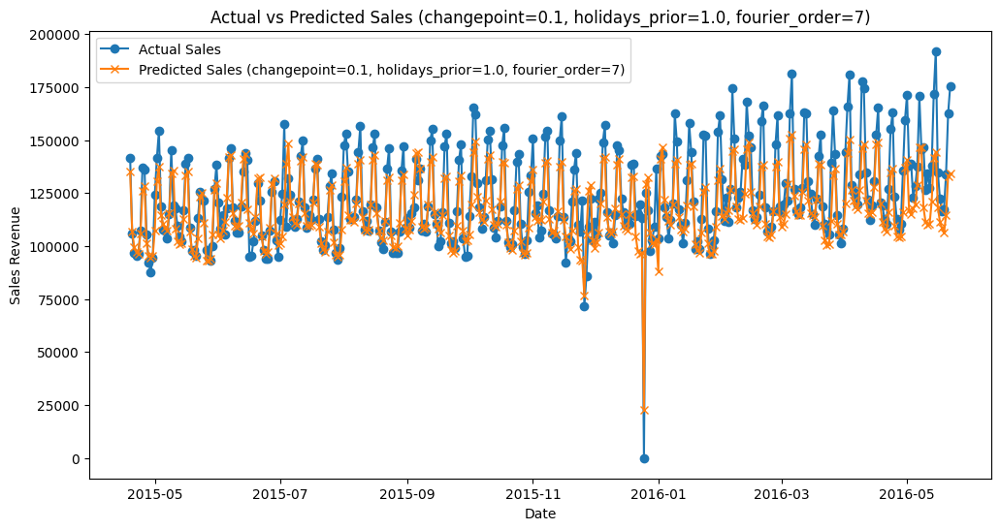

Tuning parameters: changepoint_prior_scale=0.1, seasonality_mode=additive, holidays_prior_scale=10.0, fourier_order=5


11:29:50 - cmdstanpy - INFO - Chain [1] start processing
11:29:51 - cmdstanpy - INFO - Chain [1] done processing
/Users/alexanderschou/Library/Caches/pypoetry/virtualenvs/at2-experimentation-YINVk6u--py3.12/lib/python3.12/site-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Mean Absolute Error (MAE): 8406.389628022982
Root Mean Squared Error (RMSE): 11763.872799586414
Mean Absolute Percentage Error (MAPE): 203.44%


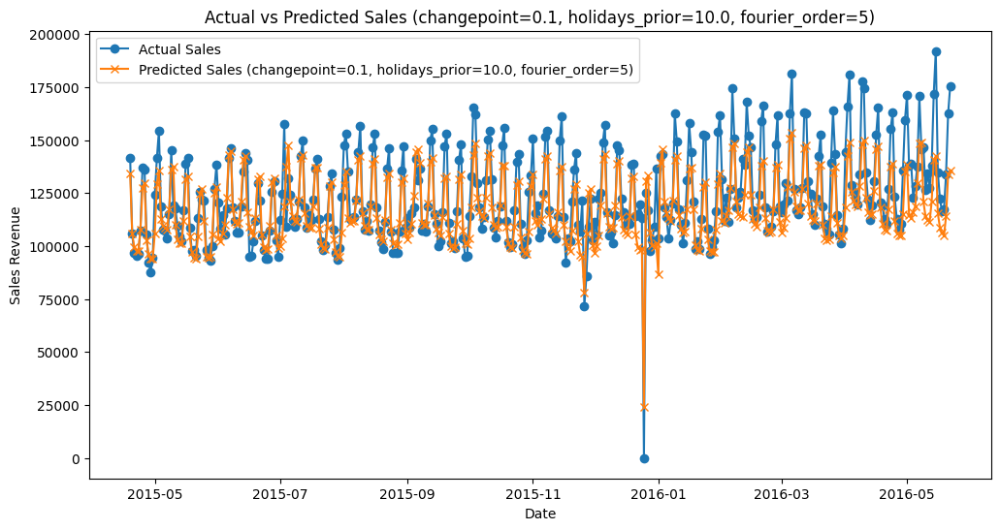

Tuning parameters: changepoint_prior_scale=0.1, seasonality_mode=additive, holidays_prior_scale=10.0, fourier_order=7


11:29:52 - cmdstanpy - INFO - Chain [1] start processing
11:29:52 - cmdstanpy - INFO - Chain [1] done processing
/Users/alexanderschou/Library/Caches/pypoetry/virtualenvs/at2-experimentation-YINVk6u--py3.12/lib/python3.12/site-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Mean Absolute Error (MAE): 8310.63417585109
Root Mean Squared Error (RMSE): 11685.872238809467
Mean Absolute Percentage Error (MAPE): 192.25%


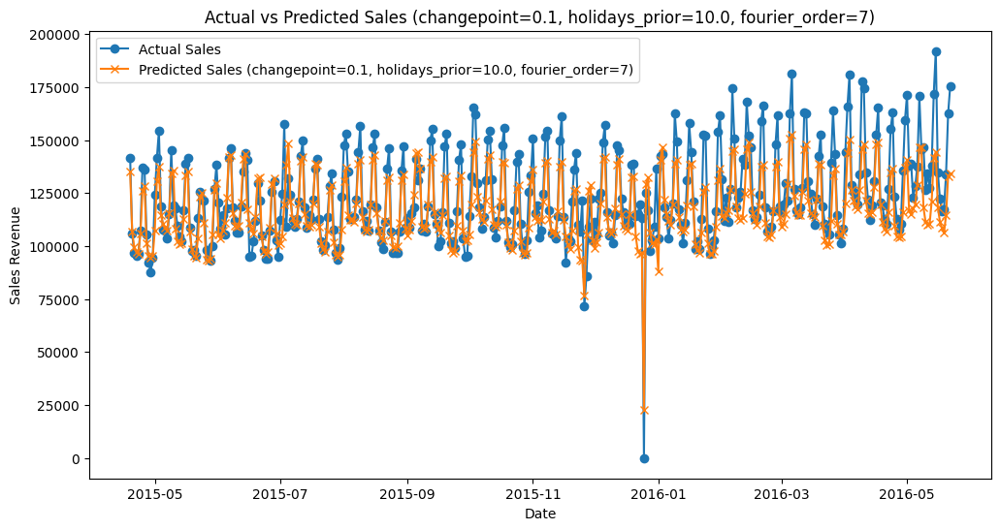

Tuning parameters: changepoint_prior_scale=0.1, seasonality_mode=additive, holidays_prior_scale=100.0, fourier_order=5


11:29:53 - cmdstanpy - INFO - Chain [1] start processing
11:29:53 - cmdstanpy - INFO - Chain [1] done processing
/Users/alexanderschou/Library/Caches/pypoetry/virtualenvs/at2-experimentation-YINVk6u--py3.12/lib/python3.12/site-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Mean Absolute Error (MAE): 8426.032232211237
Root Mean Squared Error (RMSE): 11786.732109551014
Mean Absolute Percentage Error (MAPE): 202.76%


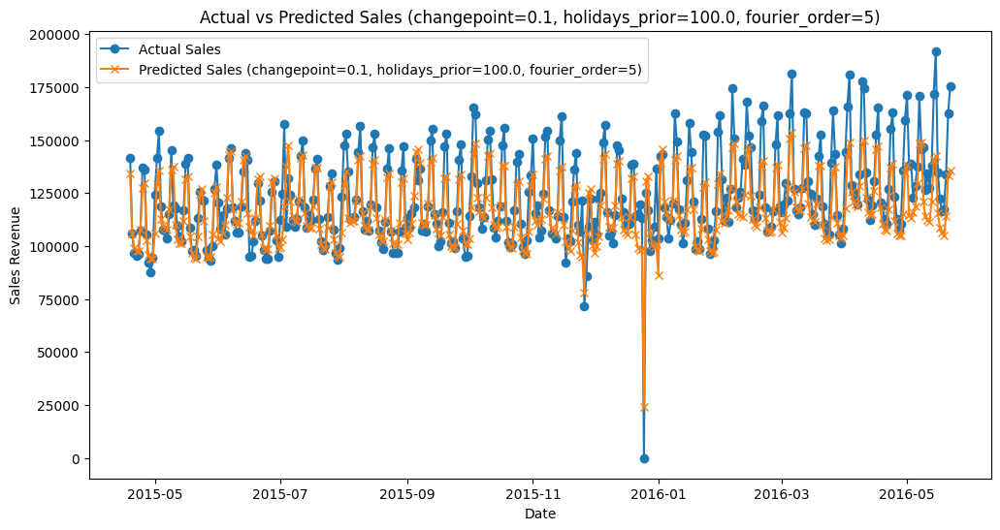

Tuning parameters: changepoint_prior_scale=0.1, seasonality_mode=additive, holidays_prior_scale=100.0, fourier_order=7


11:29:54 - cmdstanpy - INFO - Chain [1] start processing
11:29:55 - cmdstanpy - INFO - Chain [1] done processing
/Users/alexanderschou/Library/Caches/pypoetry/virtualenvs/at2-experimentation-YINVk6u--py3.12/lib/python3.12/site-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Mean Absolute Error (MAE): 8308.789565364525
Root Mean Squared Error (RMSE): 11683.630326200624
Mean Absolute Percentage Error (MAPE): 192.20%


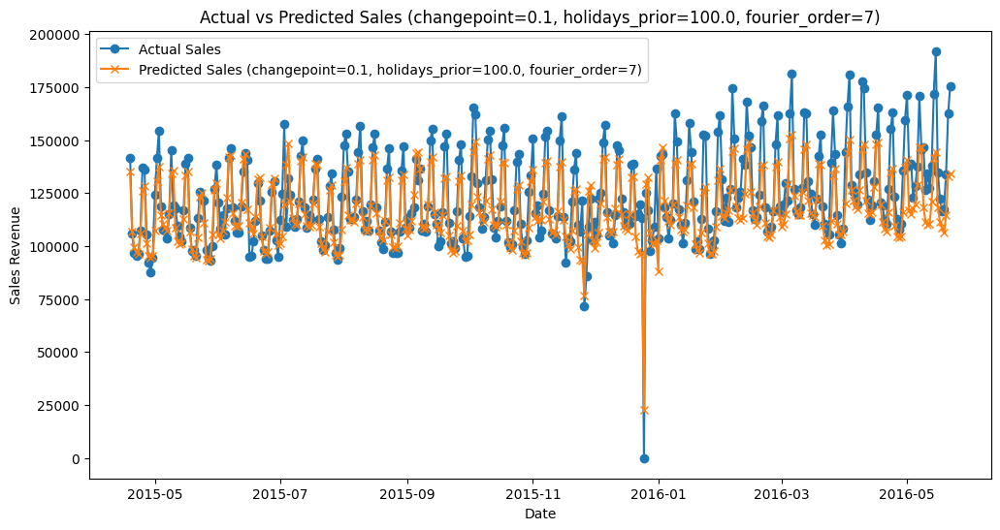

Tuning parameters: changepoint_prior_scale=0.1, seasonality_mode=additive, holidays_prior_scale=10000.0, fourier_order=5


11:29:56 - cmdstanpy - INFO - Chain [1] start processing
11:29:56 - cmdstanpy - INFO - Chain [1] done processing
/Users/alexanderschou/Library/Caches/pypoetry/virtualenvs/at2-experimentation-YINVk6u--py3.12/lib/python3.12/site-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Mean Absolute Error (MAE): 8405.165621350687
Root Mean Squared Error (RMSE): 11762.332536961134
Mean Absolute Percentage Error (MAPE): 203.21%


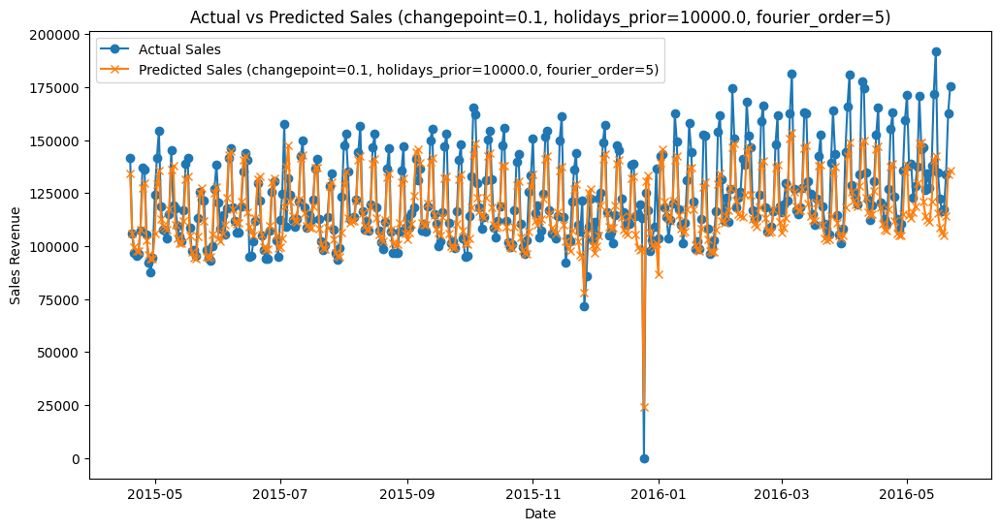

Tuning parameters: changepoint_prior_scale=0.1, seasonality_mode=additive, holidays_prior_scale=10000.0, fourier_order=7


11:29:57 - cmdstanpy - INFO - Chain [1] start processing
11:29:57 - cmdstanpy - INFO - Chain [1] done processing
/Users/alexanderschou/Library/Caches/pypoetry/virtualenvs/at2-experimentation-YINVk6u--py3.12/lib/python3.12/site-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Mean Absolute Error (MAE): 8302.586982059833
Root Mean Squared Error (RMSE): 11677.419911045807
Mean Absolute Percentage Error (MAPE): 192.37%


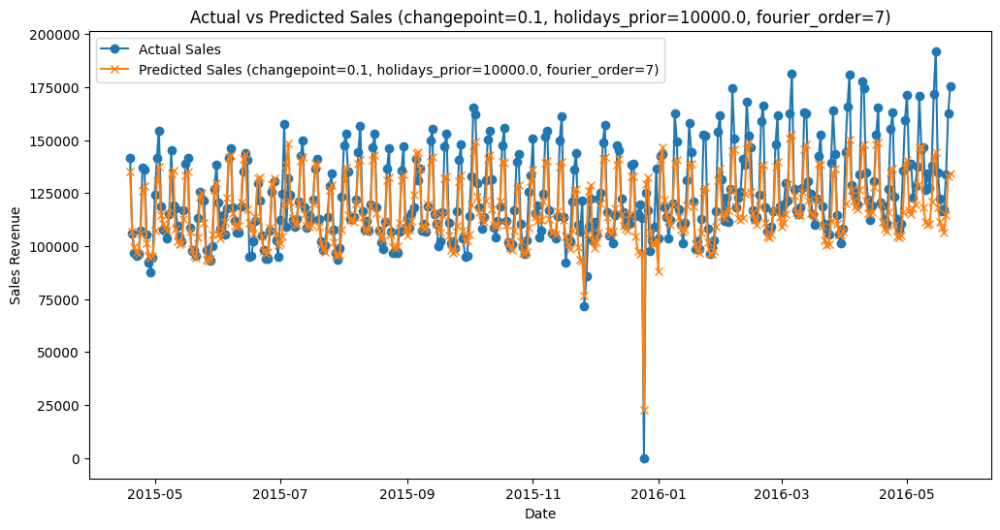

Tuning parameters: changepoint_prior_scale=0.1, seasonality_mode=multiplicative, holidays_prior_scale=1.0, fourier_order=5


11:29:58 - cmdstanpy - INFO - Chain [1] start processing
11:29:59 - cmdstanpy - INFO - Chain [1] done processing
/Users/alexanderschou/Library/Caches/pypoetry/virtualenvs/at2-experimentation-YINVk6u--py3.12/lib/python3.12/site-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Mean Absolute Error (MAE): 7994.003809461853
Root Mean Squared Error (RMSE): 10928.533753533367
Mean Absolute Percentage Error (MAPE): 70.73%


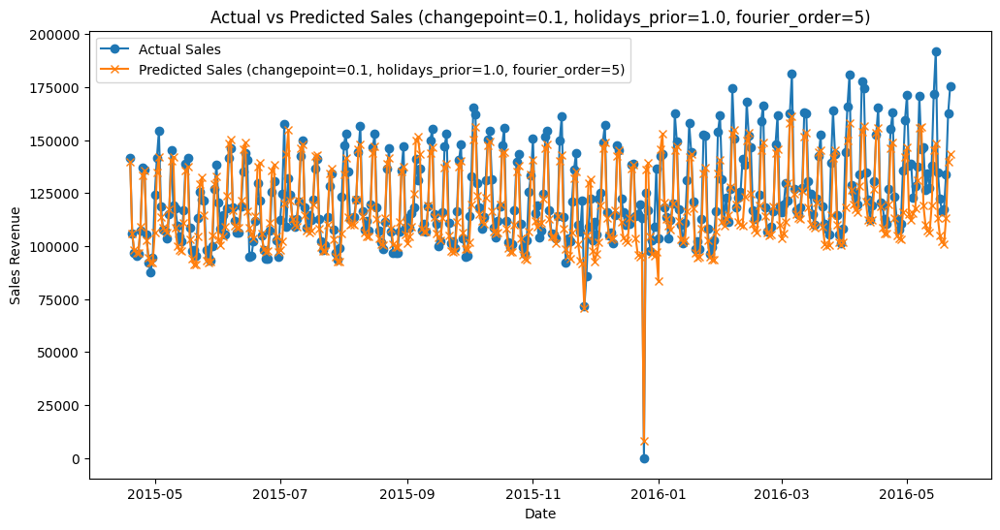

Tuning parameters: changepoint_prior_scale=0.1, seasonality_mode=multiplicative, holidays_prior_scale=1.0, fourier_order=7


11:30:00 - cmdstanpy - INFO - Chain [1] start processing
11:30:00 - cmdstanpy - INFO - Chain [1] done processing
/Users/alexanderschou/Library/Caches/pypoetry/virtualenvs/at2-experimentation-YINVk6u--py3.12/lib/python3.12/site-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Mean Absolute Error (MAE): 8058.74111869955
Root Mean Squared Error (RMSE): 10915.345274410636
Mean Absolute Percentage Error (MAPE): 64.61%


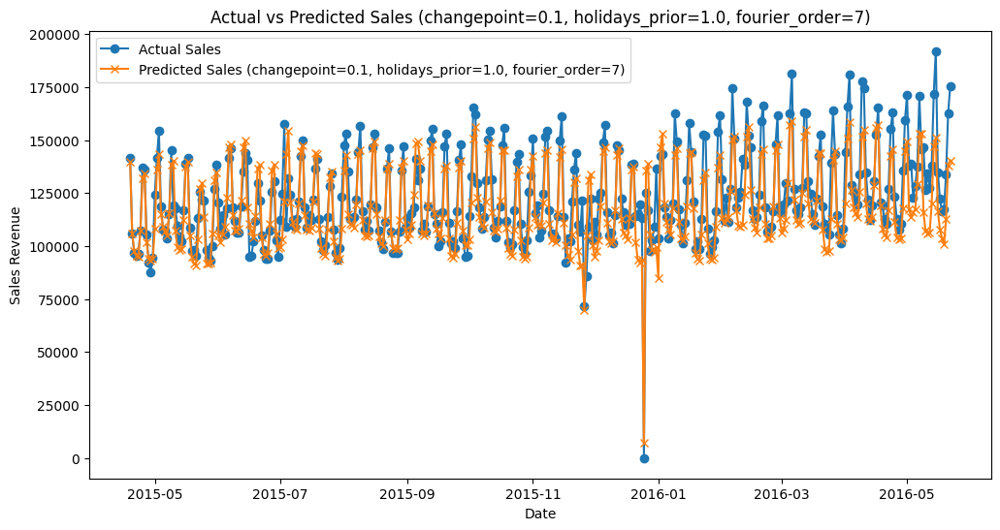

Tuning parameters: changepoint_prior_scale=0.1, seasonality_mode=multiplicative, holidays_prior_scale=10.0, fourier_order=5


11:30:01 - cmdstanpy - INFO - Chain [1] start processing
11:30:01 - cmdstanpy - INFO - Chain [1] done processing
/Users/alexanderschou/Library/Caches/pypoetry/virtualenvs/at2-experimentation-YINVk6u--py3.12/lib/python3.12/site-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Mean Absolute Error (MAE): 7924.146012042946
Root Mean Squared Error (RMSE): 10851.525639563502
Mean Absolute Percentage Error (MAPE): 70.79%


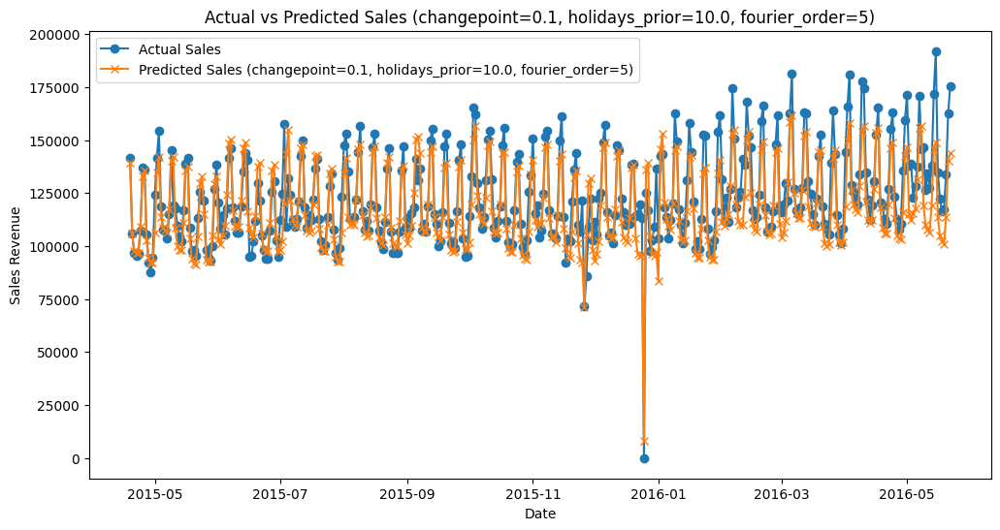

Tuning parameters: changepoint_prior_scale=0.1, seasonality_mode=multiplicative, holidays_prior_scale=10.0, fourier_order=7


11:30:02 - cmdstanpy - INFO - Chain [1] start processing
11:30:03 - cmdstanpy - INFO - Chain [1] done processing
/Users/alexanderschou/Library/Caches/pypoetry/virtualenvs/at2-experimentation-YINVk6u--py3.12/lib/python3.12/site-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Mean Absolute Error (MAE): 7976.784096345455
Root Mean Squared Error (RMSE): 10825.878674440928
Mean Absolute Percentage Error (MAPE): 64.72%


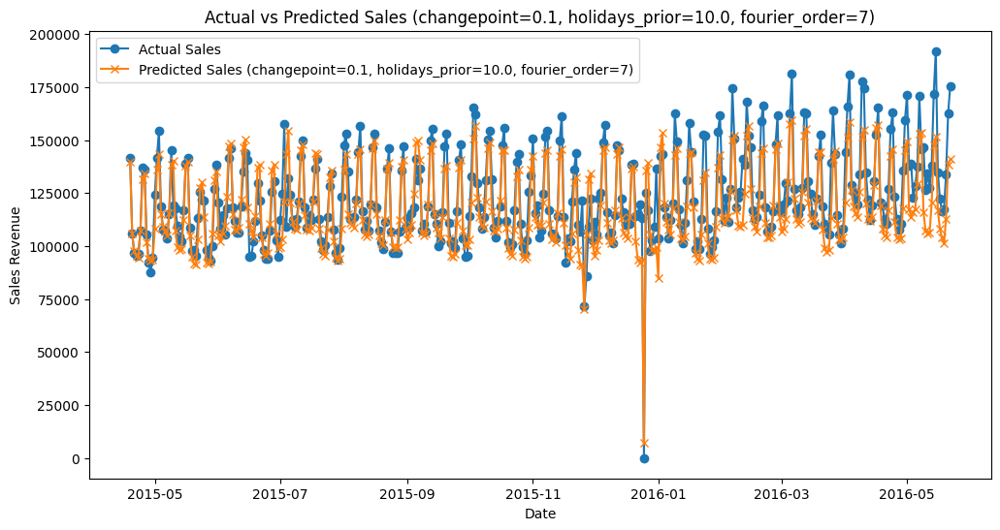

Tuning parameters: changepoint_prior_scale=0.1, seasonality_mode=multiplicative, holidays_prior_scale=100.0, fourier_order=5


11:30:04 - cmdstanpy - INFO - Chain [1] start processing
11:30:04 - cmdstanpy - INFO - Chain [1] done processing
/Users/alexanderschou/Library/Caches/pypoetry/virtualenvs/at2-experimentation-YINVk6u--py3.12/lib/python3.12/site-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Mean Absolute Error (MAE): 7921.967201594929
Root Mean Squared Error (RMSE): 10852.227145994779
Mean Absolute Percentage Error (MAPE): 70.62%


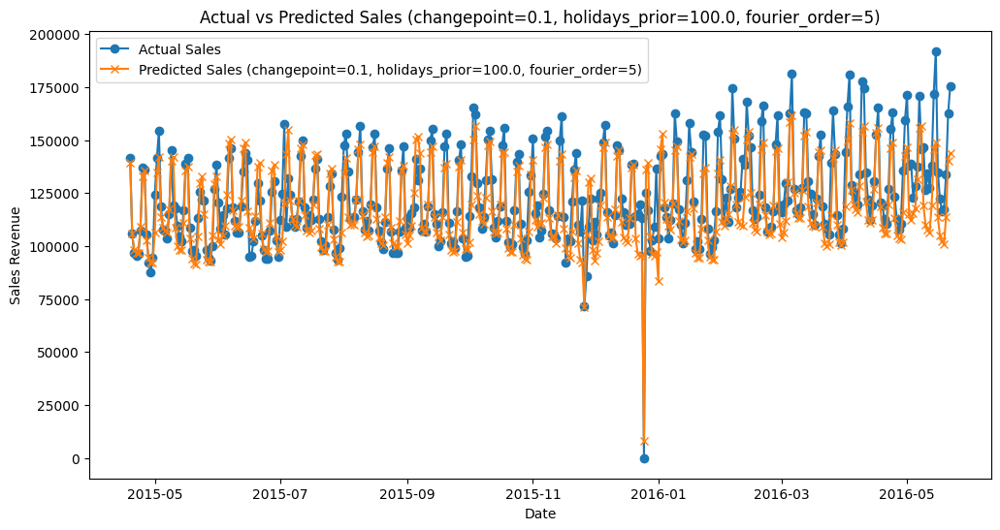

Tuning parameters: changepoint_prior_scale=0.1, seasonality_mode=multiplicative, holidays_prior_scale=100.0, fourier_order=7


11:30:05 - cmdstanpy - INFO - Chain [1] start processing
11:30:05 - cmdstanpy - INFO - Chain [1] done processing
/Users/alexanderschou/Library/Caches/pypoetry/virtualenvs/at2-experimentation-YINVk6u--py3.12/lib/python3.12/site-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Mean Absolute Error (MAE): 8042.626461724702
Root Mean Squared Error (RMSE): 10897.101186894388
Mean Absolute Percentage Error (MAPE): 63.97%


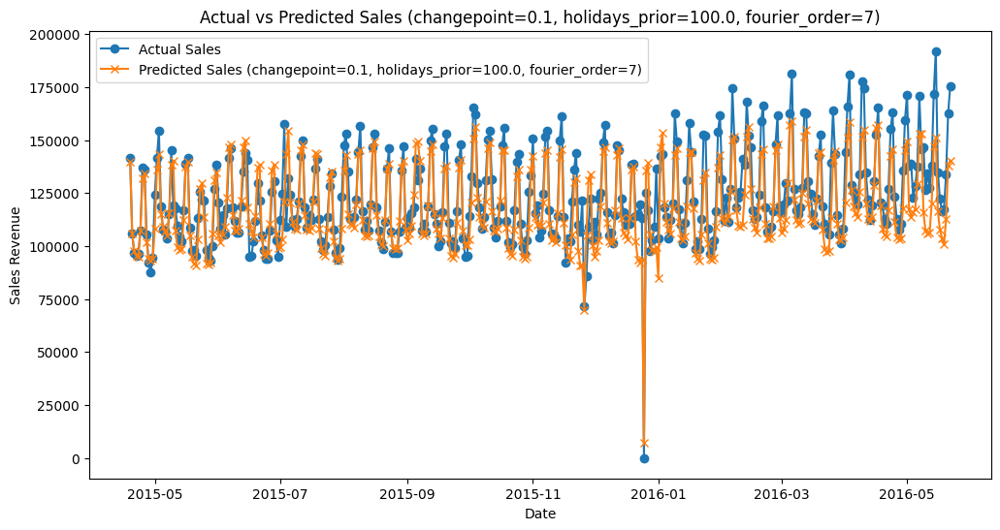

Tuning parameters: changepoint_prior_scale=0.1, seasonality_mode=multiplicative, holidays_prior_scale=10000.0, fourier_order=5


11:30:06 - cmdstanpy - INFO - Chain [1] start processing
11:30:06 - cmdstanpy - INFO - Chain [1] done processing
/Users/alexanderschou/Library/Caches/pypoetry/virtualenvs/at2-experimentation-YINVk6u--py3.12/lib/python3.12/site-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Mean Absolute Error (MAE): 7933.832608375356
Root Mean Squared Error (RMSE): 10861.955488782449
Mean Absolute Percentage Error (MAPE): 70.84%


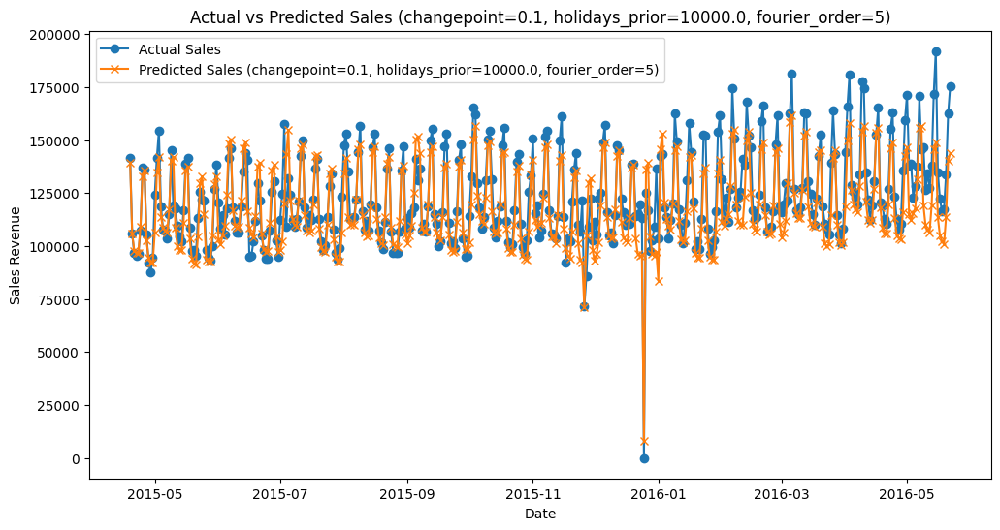

Tuning parameters: changepoint_prior_scale=0.1, seasonality_mode=multiplicative, holidays_prior_scale=10000.0, fourier_order=7


11:30:07 - cmdstanpy - INFO - Chain [1] start processing
11:30:08 - cmdstanpy - INFO - Chain [1] done processing
/Users/alexanderschou/Library/Caches/pypoetry/virtualenvs/at2-experimentation-YINVk6u--py3.12/lib/python3.12/site-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Mean Absolute Error (MAE): 8047.988574099482
Root Mean Squared Error (RMSE): 10901.653206222178
Mean Absolute Percentage Error (MAPE): 68.67%


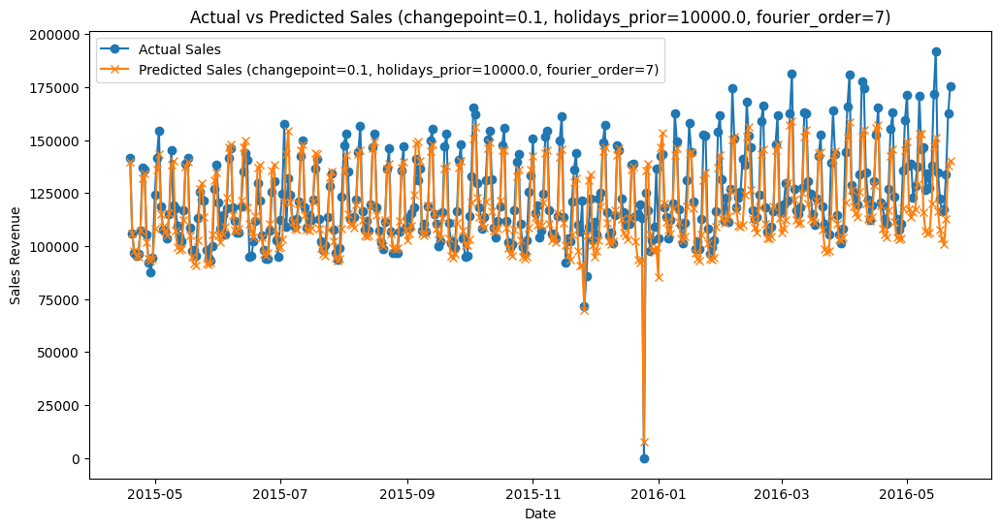

Best Parameters: {'changepoint_prior_scale': 0.001, 'seasonality_mode': 'multiplicative', 'holidays_prior_scale': 1.0, 'fourier_order': 7}


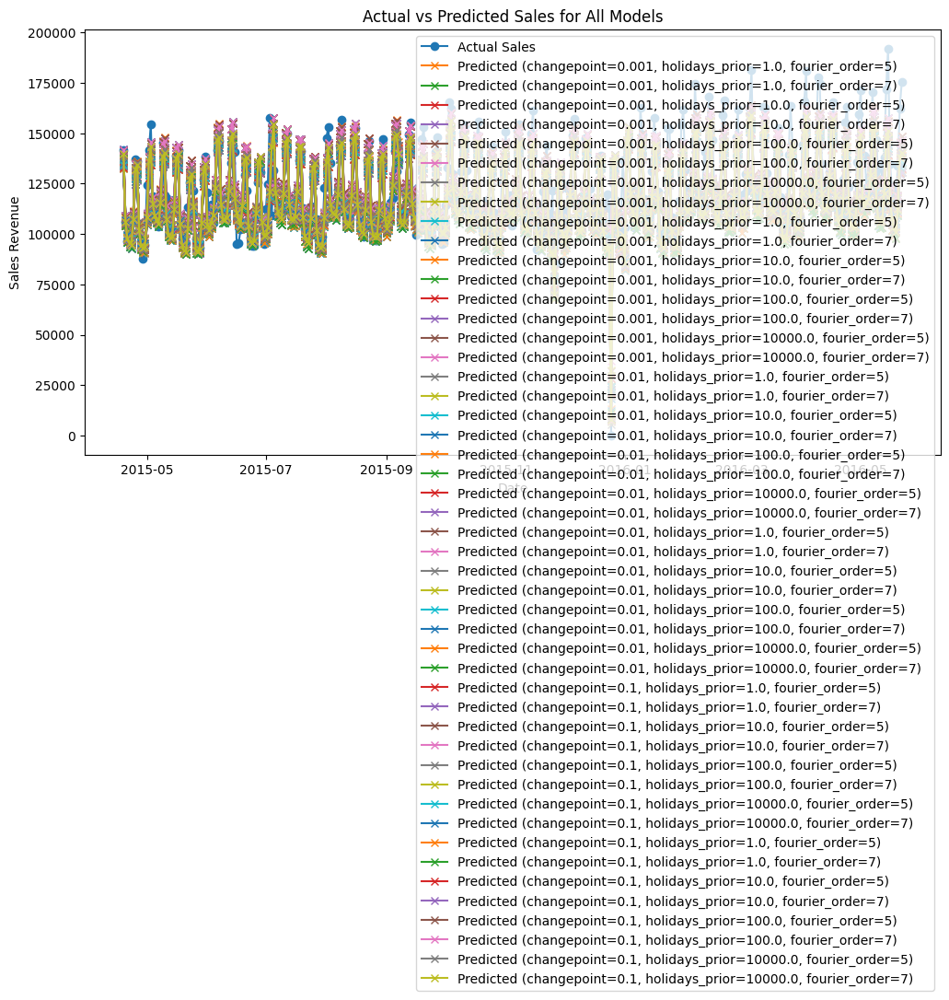

In [5]:
# Import necessary libraries
import pandas as pd
from prophet import Prophet
from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_absolute_percentage_error
import matplotlib.pyplot as plt
from itertools import product

# Function to load data
def load_data(train_path, test_path):
    try:
        sales_train_processed = pd.read_csv(train_path)
        sales_test_processed = pd.read_csv(test_path)
        return sales_train_processed, sales_test_processed
    except Exception as e:
        print(f"Error loading data: {e}")
        return None, None

# Function to preprocess data
def preprocess_data(sales_train, sales_test):
    sales_train['date'] = pd.to_datetime(sales_train['date'])
    sales_test['date'] = pd.to_datetime(sales_test['date'])

    daily_sales_train = sales_train.groupby('date')['revenue'].sum().reset_index()
    daily_sales_train.rename(columns={'date': 'ds', 'revenue': 'y'}, inplace=True)

    daily_sales_test = sales_test.groupby('date')['revenue'].sum().reset_index()
    daily_sales_test.rename(columns={'date': 'ds', 'revenue': 'y'}, inplace=True)

    return daily_sales_train, daily_sales_test

# Function to fit the Prophet model with U.S. holidays and custom seasonalities
def fit_prophet_model(train_data, add_seasonality=None, **params):
    model = Prophet(**params)
    model.add_country_holidays(country_name='US')  # Add U.S. holidays
    
    # Add custom seasonality
    if add_seasonality is not None:
        for seasonality in add_seasonality:
            model.add_seasonality(name=seasonality['name'], period=seasonality['period'], fourier_order=seasonality['fourier_order'])

    model.fit(train_data)
    return model

# Function to evaluate the model
def evaluate_model(test_data, forecast_data):
    mae = mean_absolute_error(test_data['y'], forecast_data['yhat'])
    rmse = mean_squared_error(test_data['y'], forecast_data['yhat'], squared=False)
    mape = mean_absolute_percentage_error(test_data['y'], forecast_data['yhat']) * 100

    return mae, rmse, mape

# Function to plot forecast
def plot_forecast(actual, forecast, model_label):
    plt.figure(figsize=(12, 6))
    plt.plot(actual['ds'], actual['y'], label='Actual Sales', marker='o')
    plt.plot(forecast['ds'], forecast['yhat'], label=f'Predicted Sales ({model_label})', marker='x')
    plt.title(f'Actual vs Predicted Sales ({model_label})')
    plt.xlabel('Date')
    plt.ylabel('Sales Revenue')
    plt.legend()
    plt.show()


# Define hyperparameters for tuning
changepoint_prior_scales = [0.001, 0.01, 0.1]
seasonality_modes = ['additive', 'multiplicative']
holidays_prior_scales = [1.0, 10.0, 100.0, 10000.0]
fourier_orders = [5, 7]
seasonalities = [
    {'name': 'monthly', 'period': 30.5, 'fourier_order': None},  # Fourier order will be set in the loop
    {'name': 'quarterly', 'period': 91.25, 'fourier_order': None}
]

best_mae = float('inf')
best_params = {}

# Perform hyperparameter tuning
all_forecasts = []  # Store all forecasts for comparison

for changepoint_prior_scale, seasonality_mode, holidays_prior_scale, fourier_order in product(changepoint_prior_scales, seasonality_modes, holidays_prior_scales, fourier_orders):
    print(f"Tuning parameters: changepoint_prior_scale={changepoint_prior_scale}, seasonality_mode={seasonality_mode}, holidays_prior_scale={holidays_prior_scale}, fourier_order={fourier_order}")
    
    # Update Fourier order for seasonality
    for seasonality in seasonalities:
        seasonality['fourier_order'] = fourier_order

    # Fit the model with current parameters
    model = fit_prophet_model(daily_sales_train, add_seasonality=seasonalities, 
                              changepoint_prior_scale=changepoint_prior_scale, 
                              seasonality_mode=seasonality_mode,
                              holidays_prior_scale=holidays_prior_scale)

    # Make predictions on the test set
    future_test = model.make_future_dataframe(periods=len(daily_sales_test), include_history=False)
    forecast_test = model.predict(future_test)

    # Evaluate the model
    forecast_test_filtered = forecast_test[['ds', 'yhat']].head(len(daily_sales_test))
    evaluation_df = pd.merge(daily_sales_test, forecast_test_filtered, on='ds')

    mae, rmse, mape = evaluate_model(evaluation_df, forecast_test_filtered)
    print(f"Mean Absolute Error (MAE): {mae}")
    print(f"Root Mean Squared Error (RMSE): {rmse}")
    print(f"Mean Absolute Percentage Error (MAPE): {mape:.2f}%")

    # Plot current model forecast
    plot_forecast(daily_sales_test, forecast_test_filtered, f"changepoint={changepoint_prior_scale}, holidays_prior={holidays_prior_scale}, fourier_order={fourier_order}")

    # Save best model based on MAE
    if mae < best_mae:
        best_mae = mae
        best_params = {
            'changepoint_prior_scale': changepoint_prior_scale,
            'seasonality_mode': seasonality_mode,
            'holidays_prior_scale': holidays_prior_scale,
            'fourier_order': fourier_order
        }
        best_model = model

    # Save the forecast for comparison
    all_forecasts.append((forecast_test_filtered, f"changepoint={changepoint_prior_scale}, holidays_prior={holidays_prior_scale}, fourier_order={fourier_order}"))

print(f"Best Parameters: {best_params}")

# Plot forecasts for all models on a single graph for comparison
plt.figure(figsize=(12, 6))
plt.plot(daily_sales_test['ds'], daily_sales_test['y'], label='Actual Sales', marker='o')
for forecast, label in all_forecasts:
    plt.plot(forecast['ds'], forecast['yhat'], label=f'Predicted ({label})', marker='x')
plt.title('Actual vs Predicted Sales for All Models')
plt.xlabel('Date')
plt.ylabel('Sales Revenue')
plt.legend()
plt.show()

# Save the best model
# joblib.dump(best_model, 'prophet_sales_model_tuned.pkl')


11:36:58 - cmdstanpy - INFO - Chain [1] start processing
11:36:58 - cmdstanpy - INFO - Chain [1] done processing
/Users/alexanderschou/Library/Caches/pypoetry/virtualenvs/at2-experimentation-YINVk6u--py3.12/lib/python3.12/site-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Mean Absolute Error (MAE): 7280.599420454456
Root Mean Squared Error (RMSE): 11100.12333452857
Mean Absolute Percentage Error (MAPE): 836.41%


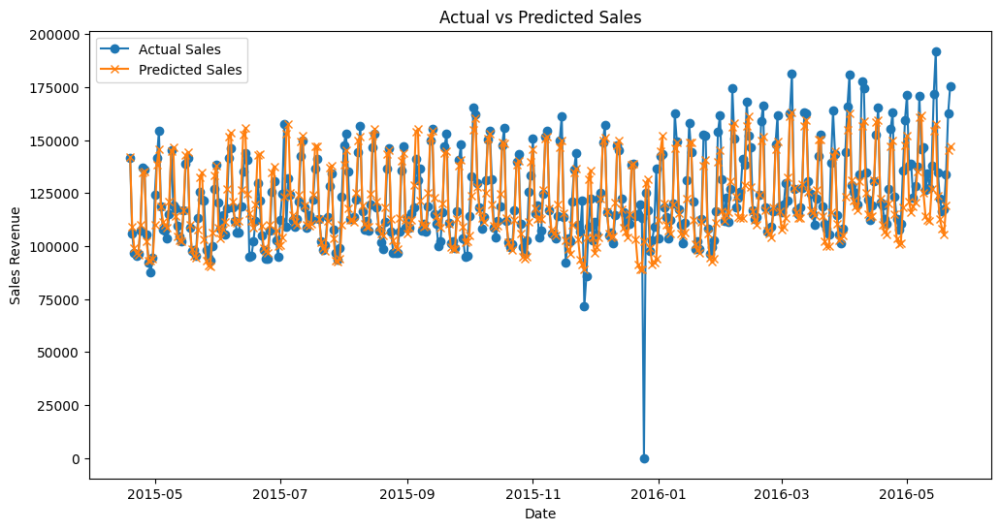

In [7]:
# Import necessary libraries
import pandas as pd
from prophet import Prophet
from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_absolute_percentage_error
import matplotlib.pyplot as plt

# Function to load data
def load_data(train_path, test_path):
    try:
        sales_train_processed = pd.read_csv(train_path)
        sales_test_processed = pd.read_csv(test_path)
        return sales_train_processed, sales_test_processed
    except Exception as e:
        print(f"Error loading data: {e}")
        return None, None

# Function to preprocess data
def preprocess_data(sales_train, sales_test):
    sales_train['date'] = pd.to_datetime(sales_train['date'])
    sales_test['date'] = pd.to_datetime(sales_test['date'])

    daily_sales_train = sales_train.groupby('date')['revenue'].sum().reset_index()
    daily_sales_train.rename(columns={'date': 'ds', 'revenue': 'y'}, inplace=True)

    daily_sales_test = sales_test.groupby('date')['revenue'].sum().reset_index()
    daily_sales_test.rename(columns={'date': 'ds', 'revenue': 'y'}, inplace=True)

    return daily_sales_train, daily_sales_test

# Function to fit Prophet model with specific parameters
def fit_prophet_model(train_data):
    model = Prophet(
        changepoint_prior_scale=0.001, 
        seasonality_mode='multiplicative', 
        holidays_prior_scale=1.0
    )
    
    # Add U.S. holidays
    model.add_country_holidays(country_name='US')

    # Add custom seasonality with fourier_order=7 for both monthly and quarterly
    model.add_seasonality(name='monthly', period=30.5, fourier_order=7)
    model.add_seasonality(name='quarterly', period=91.25, fourier_order=7)

    model.fit(train_data)
    return model

# Function to evaluate the model
def evaluate_model(test_data, forecast_data):
    mae = mean_absolute_error(test_data['y'], forecast_data['yhat'])
    rmse = mean_squared_error(test_data['y'], forecast_data['yhat'], squared=False)
    mape = mean_absolute_percentage_error(test_data['y'], forecast_data['yhat']) * 100

    return mae, rmse, mape

# Function to plot forecast
def plot_forecast(actual, forecast):
    plt.figure(figsize=(12, 6))
    plt.plot(actual['ds'], actual['y'], label='Actual Sales', marker='o')
    plt.plot(forecast['ds'], forecast['yhat'], label='Predicted Sales', marker='x')
    plt.title('Actual vs Predicted Sales')
    plt.xlabel('Date')
    plt.ylabel('Sales Revenue')
    plt.legend()
    plt.show()

# Fit the model with best parameters
model = fit_prophet_model(daily_sales_train)

# Make predictions on the test set
future_test = model.make_future_dataframe(periods=len(daily_sales_test), include_history=False)
forecast_test = model.predict(future_test)

# Filter the forecast for evaluation
forecast_test_filtered = forecast_test[['ds', 'yhat']].head(len(daily_sales_test))
evaluation_df = pd.merge(daily_sales_test, forecast_test_filtered, on='ds')

# Evaluate the model
mae, rmse, mape = evaluate_model(evaluation_df, forecast_test_filtered)

# Print metrics
print(f"Mean Absolute Error (MAE): {mae}")
print(f"Root Mean Squared Error (RMSE): {rmse}")
print(f"Mean Absolute Percentage Error (MAPE): {mape:.2f}%")

# Plot the forecast
plot_forecast(daily_sales_test, forecast_test_filtered)


In [8]:
prophet_final = model
joblib.dump(prophet_final, 'prophet_final.pkl')

['prophet_final.pkl']

In [9]:
import os
os.getcwd()

'/Users/alexanderschou/Desktop/Projects/adv_mla_2024/AT2_experimentation/data/processed'

In [12]:
forecast_test_filtered[forecast_test_filtered["ds"]=="2015-12-24"]

,ds,yhat
249,2015-12-24,89160.77972
